# SALES PREDICTIONS FOR ACME TEXTILE CORP

This project was developed for the IE Capstone Project with the dataset provided by KPMG of ACME Textile Corp.

1. [Importing Libraries](#section-1)
2. [Importing Dataset](#section-2)
3. [Exploratory Data Anlysis](#section-3)
4. [Data Cleaning](#section-4)
5. [Feature Engineering](#section-5)
6. [Model for ID #120010970](#section-6)
7. [Model for ID #120011782](#section-7)
8. [Model for ID #120011556](#section-8)
9. [Model for ID #120012154](#section-9)
10. [Model for ID #120010566](#section-10)
11. [Model for ID #120010342](#section-11)
12. [Model for ID #120009814](#section-12)
13. [Model for ID #120004096](#section-13)
14. [Model for ID #120014488](#section-14)
15. [Model for ID #120014486](#section-15)
16. [Model for ID #120009816](#section-16)
17. [Model for ID #120015996](#section-17)
18. [Model for ID #120012606](#section-18)
19. [Model for ID #120015842](#section-19)
20. [Compiling Predictions](#section-20)


## 1. Import libraries <a id='section-1'></a>
The libraries which will be used are imported. They will also be configured if needed. 

In [1]:
#!pip install pmdarima
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels as sm
import pmdarima
from pmdarima.arima import ndiffs, nsdiffs
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.stats import shapiro
import seaborn as sns
import scipy.stats as st
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_percentage_error
from datetime import datetime, timedelta
from sklearn.metrics import accuracy_score

#Configure Pandas
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

C:\Users\amish\AppData\Local\Temp/ipykernel_13180/4268907610.py:3: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


## 2. Import dataset <a id='section-2'></a>

All the data was taken from the dataset provided by KPMG. The dataset has the following columns:
- year-week: Year and number of week inside a year
- ID_material: Internal identification number of the product
- Units: Units of sales for each product every week of the year

In [2]:
#Import data

url = 'https://raw.githubusercontent.com/AmisheeChoksi/IE_Capstone_KPMG_Group9/main/IE%20KPMG_Demand%20Forecast%20dataset.csv'
df = pd.read_csv(url)

In [3]:
## Import data

# Actually import data
#df = pd.read_excel('./IE KPMG_Demand Forecast dataset.xlsx')

In [4]:
df.head()

,year-week,ID_material,Units
0,2019-11,120010970,540
1,2019-12,120010970,750
2,2019-13,120010970,960
3,2019-14,120010970,720
4,2019-15,120010970,1620


# 3. Exploratory Data Analysis (EDA) <a id='section-3'></a>

In [5]:
df.shape

(2857, 3)

In [6]:
df.isnull().sum()

year-week      0
ID_material    0
Units          0
dtype: int64

In [7]:
print("The initial type for each column is: ")
df.dtypes

The initial type for each column is: 


year-week      object
ID_material     int64
Units          object
dtype: object

The **ID_material & Units** columns will need to be transformed to a integer.

In [8]:
# While going through the data we noticed that some values in the Units column were decimals. Let's highlight them to see how many we have and where they are located.

float_rows = df[df['Units'].astype(str).str.contains('\.5')]
float_rows

,year-week,ID_material,Units
2450,2019-30,120014488,1822.5
2743,2020-31,120015996,1358.5
2745,2020-33,120015996,1952.5


Although at a first glance it seems that the data is clean, rows **#2450, #2743, #2745** have decimal values, which means that it is an erroneous value as it is not possible to sell half of an item. These values will be handeled later on.

In [9]:
print("Number of ID_material:", len(df['ID_material'].unique()))
print (df['ID_material'].value_counts())

Number of ID_material: 14
120004096    299
120014488    268
120014486    261
120009816    243
120015996    240
120009814    233
120010342    231
120010566    218
120010970    186
120011782    165
120011556    157
120012154    138
120012606    118
120015842    100
Name: ID_material, dtype: int64


In [10]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 3.1. Main Takeaways from EDA

The main takeaways from the EDA process are the following:

**Missing values:** No missing values were detected. Although in the column "Units" 8% of the rows have zero values, this does not mean it is a missing value, it just indicates there were no sales for that specific material in a given date.

**Outliers:** No clear outliers have been detected.

**Correlations:** There is no correlation among any of the columns.

**Prediction and target feature:** The target feature is numerical (Units). Decissions will need to be made as to, how to properly handle dates, and if possible how to enrich the data as 3 columns and almost 3000 rows is scarce when trying to build a machine learning algorithgm.

# 4. Cleaning Data <a id='section-4'></a>

In [11]:
#Converting ID_material into float to an integer

df['ID_material'] = df['ID_material'].apply(lambda x: int(x))

In [12]:
df.dtypes

year-week      object
ID_material     int64
Units          object
dtype: object

In [13]:
#Cleaning the "Units" column by converting the column into a float first.
df['Units'] = pd.to_numeric(df['Units'], errors='coerce').fillna(0)

#Now that the column is a float we need to round up the values that have a decimal value and convert it to an integer value.
df['Units'] = df['Units'].apply(lambda x: int(np.ceil(x)))

In [14]:
df.dtypes

year-week      object
ID_material     int64
Units           int64
dtype: object

In [15]:
#Checking the cleaning steps were done correctly

df.head()

,year-week,ID_material,Units
0,2019-11,120010970,540
1,2019-12,120010970,750
2,2019-13,120010970,960
3,2019-14,120010970,720
4,2019-15,120010970,1620


# 5. Feature Engineering <a id='section-5'></a>

We know that sales are recorded every Saturday of the week, the next step is to add a column to the df where the year-week column is transformed into a full date format (YYYY - MM - DD).

In [16]:
# Create date column
df['date'] = pd.to_datetime(df['year-week'] + '-6', format='%G-%V-%u')

# Print resulting dataframe
print(df)

     year-week  ID_material  Units       date
0      2019-11    120010970    540 2019-03-16
1      2019-12    120010970    750 2019-03-23
2      2019-13    120010970    960 2019-03-30
3      2019-14    120010970    720 2019-04-06
4      2019-15    120010970   1620 2019-04-13
5      2019-16    120010970    900 2019-04-20
6      2019-17    120010970    420 2019-04-27
7      2019-18    120010970    360 2019-05-04
8      2019-19    120010970   1320 2019-05-11
9      2019-20    120010970    600 2019-05-18
10     2019-21    120010970   2130 2019-05-25
11     2019-22    120010970   3660 2019-06-01
12     2019-23    120010970   3360 2019-06-08
13     2019-24    120010970   2040 2019-06-15
14     2019-25    120010970   2400 2019-06-22
15     2019-26    120010970   2520 2019-06-29
16     2019-27    120010970   1800 2019-07-06
17     2019-28    120010970      0 2019-07-13
18     2019-29    120010970    360 2019-07-20
19     2019-30    120010970    240 2019-07-27
20     2019-31    120010970   1200

In [17]:
df.head()

,year-week,ID_material,Units,date
0,2019-11,120010970,540,2019-03-16
1,2019-12,120010970,750,2019-03-23
2,2019-13,120010970,960,2019-03-30
3,2019-14,120010970,720,2019-04-06
4,2019-15,120010970,1620,2019-04-13


In [18]:
#Reordering the columns

columns = ['date', 'year-week', 'ID_material','Units']
df = df.reindex(columns=columns)

In [19]:
df.head()

,date,year-week,ID_material,Units
0,2019-03-16,2019-11,120010970,540
1,2019-03-23,2019-12,120010970,750
2,2019-03-30,2019-13,120010970,960
3,2019-04-06,2019-14,120010970,720
4,2019-04-13,2019-15,120010970,1620


In [20]:
df['ID_material'] = df['ID_material'].astype(str)

In [21]:
df.dtypes

date           datetime64[ns]
year-week              object
ID_material            object
Units                   int64
dtype: object

In [22]:
#Visualization of sales of ID_material's
for i in df['ID_material'].unique():
    subset = df[df['ID_material'] == i]
    subset['moving_average'] = subset['Units'].rolling(3).mean()
    fig = px.line(subset, x="date", y=["Units", "moving_average"], title = i, template = 'plotly_dark')
    fig.show()

C:\Users\amish\AppData\Local\Temp/ipykernel_13180/1618552519.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['moving_average'] = subset['Units'].rolling(3).mean()


C:\Users\amish\AppData\Local\Temp/ipykernel_13180/1618552519.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# 6. Model SARIMA for Item #120010970 <a id='section-6'></a>

In [23]:
#Creating a df for ID_material #120010970

df_10970 =df[df['ID_material']=='120010970']

In [24]:
#Ordering the dates ascending order

df_10970.sort_values("date", inplace=True, ascending=True)
df_10970.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,year-week,ID_material,Units
0,2019-03-16,2019-11,120010970,540
1,2019-03-23,2019-12,120010970,750
2,2019-03-30,2019-13,120010970,960
3,2019-04-06,2019-14,120010970,720
4,2019-04-13,2019-15,120010970,1620


In [25]:
#We do not need the columns year-week and ID_material, so we drop them.

df_10970.drop(columns=['year-week', 'ID_material'], inplace=True)

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [26]:
df_10970.head()

,date,Units
0,2019-03-16,540
1,2019-03-23,750
2,2019-03-30,960
3,2019-04-06,720
4,2019-04-13,1620


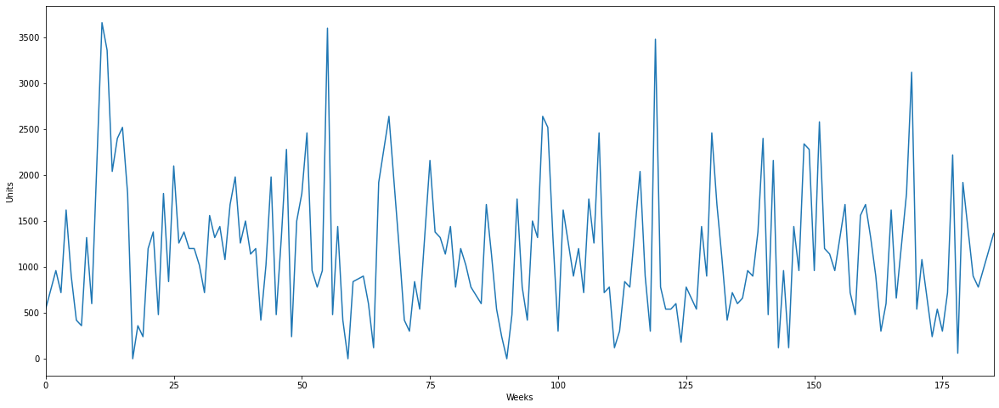

In [27]:
y_10970 = df_10970.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = 185
plt.xlim(0, num_lags) 
plt.plot(y_10970)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [28]:
## Basic statistics

# Calculate
mean = np.mean(y_10970)
std = np.std(y_10970)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 1172.4193548387098
The standard deviation is: 738.3229372201505


In [29]:
# Count zeros in each column
num_zeros = y_10970.eq(0).sum()
length = len(y_10970)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  186 rows
The amount of 0's in the dataset is:  3


## 6.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 6.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [30]:
# Calculate the number of rows in the dataframe
y_10970_rows = y_10970.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_10970_rows * 0.80)

# Split the data into training and test sets
y10970_train = y_10970.iloc[:last_train_row]
y10970_test = y_10970.iloc[last_train_row:]

In [31]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y10970_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 6.753293553768437e-16
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 6.3. Autocorrelation and partial autocorrelation
Both graphs will be checked.

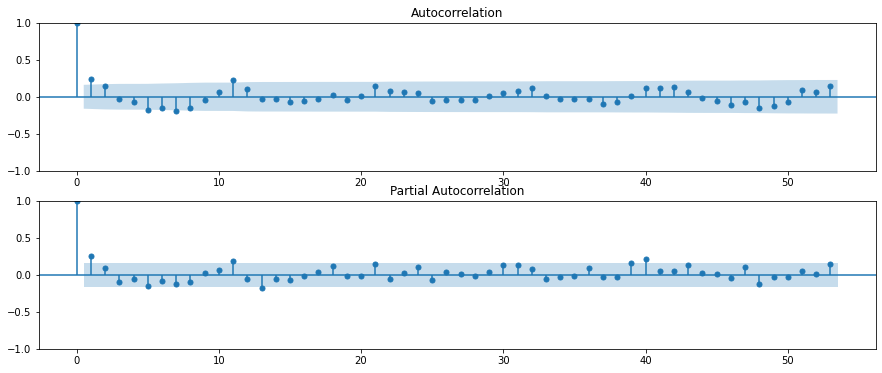

In [32]:
## Plot graphs

# Set number of lags
nlags = 53

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y10970_train, lags = nlags, ax=ax[0])
plot_pacf(y10970_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.

### 6.4 Modeling

### 6.4.1. Model: Taking differences
The differences

In [33]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y10970_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y10970_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 6.4.2. Model

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



                                SARIMAX Results                                 
Dep. Variable:                    Units   No. Observations:                  148
Model:             SARIMAX(2, 1, 0, 52)   Log Likelihood                -779.366
Date:                  Mon, 27 Feb 2023   AIC                           1564.731
Time:                          14:45:27   BIC                           1572.425
Sample:                               0   HQIC                          1567.841
                                  - 148                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L52      -1.0053      0.181     -5.565      0.000      -1.359      -0.651
ar.S.L104     -0.6182      0.162     -3.806      0.000      -0.937      -0.300
sigma2      3.844e+05   1.46e+05    

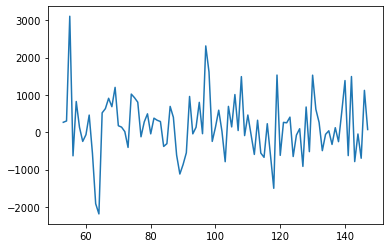

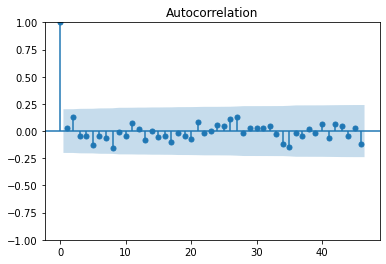

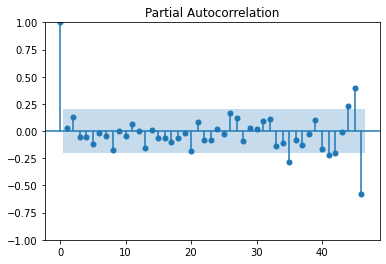

In [34]:
fit = SARIMAX(endog = y10970_train, order = (0,0,0), seasonal_order = (2,1,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=46

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9704220294952393 p-value 0.030015060678124428


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



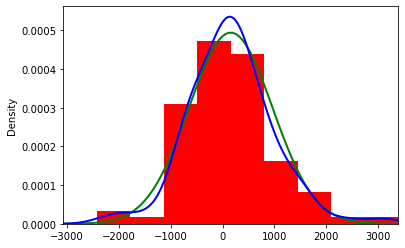

In [35]:
# Normality and residuals test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

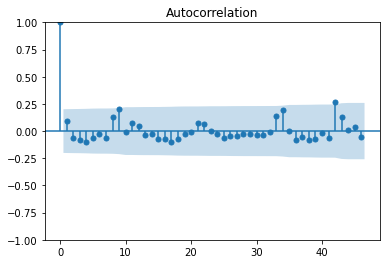

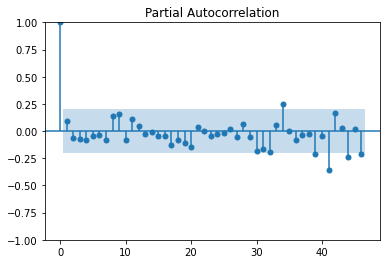

In [36]:
## ACF and PACF for square residuals

plot_acf(residuos**2,lags=46)
plt.show()
plot_pacf(residuos**2,lags=46,method="ols")
plt.show()

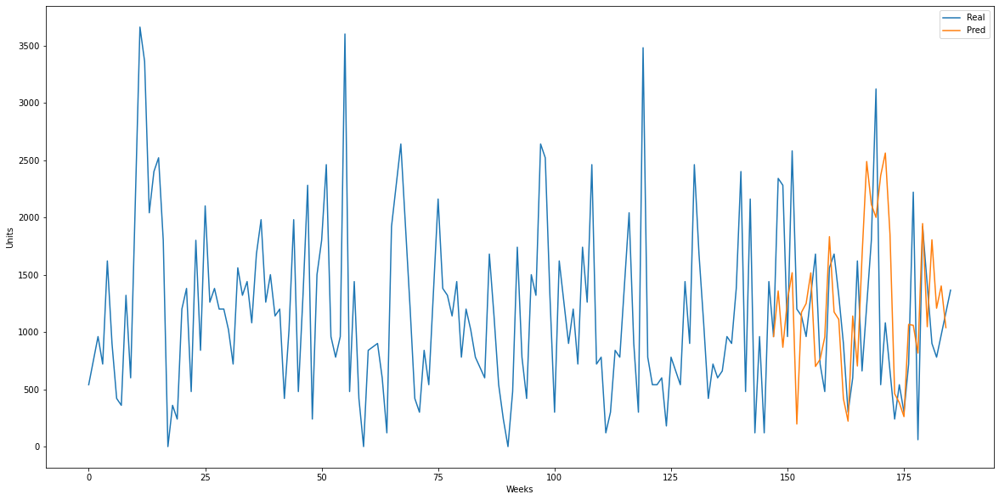

In [37]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 37)

# Putting the last real index
y_pred.loc[len(y10970_train)-1] = y10970_train[len(y10970_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

#Plotting 
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_10970, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [38]:
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error

print("MAPE score:", mean_absolute_percentage_error(y10970_test, y_pred))
print("MAE score:", mean_absolute_error(y10970_test, y_pred))

MAPE score: 1.0984875953283768
MAE score: 594.4583898203658


### 6.4.3 Creating a prediction for the next 8 weeks

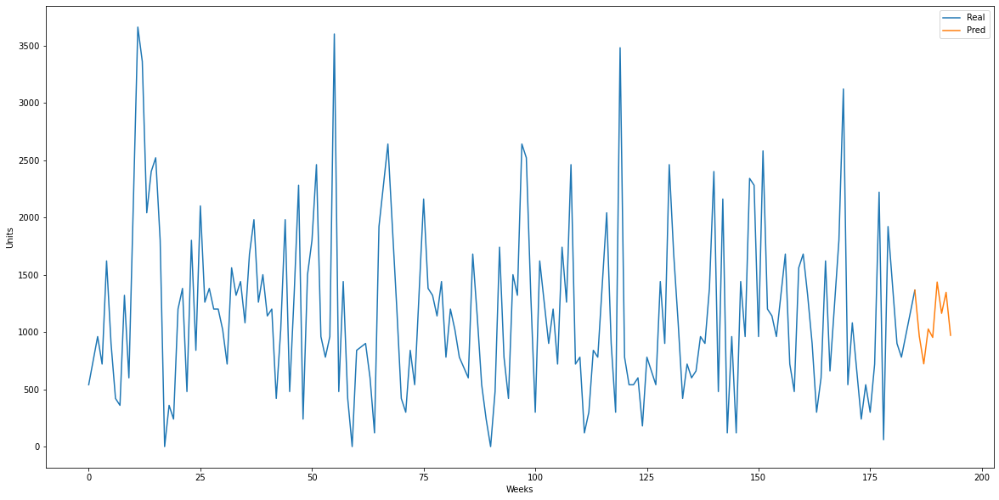

In [39]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_10970, order = (0,0,0), seasonal_order = (2,1,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_10970)-1] = y_10970[len(y_10970)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_10970, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()


In [40]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df1 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df1)

   Date  Forecast
0   185    1365.0
1   186     962.0
2   187     722.0
3   188    1027.0
4   189     952.0
5   190    1436.0
6   191    1162.0
7   192    1346.0
8   193     971.0


In [41]:
predictions1 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120010970','120010970','120010970','120010970','120010970','120010970','120010970','120010970',],
        'Forecast': [962, 722, 1027, 952, 1436, 1162, 1346, 971]}

# Create the new DataFrame
df_forecast1 = pd.DataFrame(predictions1)

# Print the new DataFrame
print(df_forecast1)

      Date ID_Material  Forecast
0  2022-40   120010970       962
1  2022-41   120010970       722
2  2022-42   120010970      1027
3  2022-43   120010970       952
4  2022-44   120010970      1436
5  2022-45   120010970      1162
6  2022-46   120010970      1346
7  2022-47   120010970       971


# 7. Model SARIMA for Item #120011782 <a id='section-7'></a>

In [42]:
#Creating a df for ID_material #120011782
df_11782 =df[df['ID_material']=='120011782']

In [43]:
df_11782.head()

,date,year-week,ID_material,Units
1923,2019-08-10,2019-32,120011782,1344
1924,2019-08-17,2019-33,120011782,2604
1925,2019-08-24,2019-34,120011782,2604
1926,2019-08-31,2019-35,120011782,2772
1927,2019-09-07,2019-36,120011782,2100


In [44]:
#Ordering the dates ascending order

df_11782.sort_values("date", inplace=True, ascending=True)
df_11782.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,year-week,ID_material,Units
1923,2019-08-10,2019-32,120011782,1344
1924,2019-08-17,2019-33,120011782,2604
1925,2019-08-24,2019-34,120011782,2604
1926,2019-08-31,2019-35,120011782,2772
1927,2019-09-07,2019-36,120011782,2100


In [45]:
#We do not need the columns year-week and ID_material so we drop them

df_11782.drop(columns=['year-week', 'ID_material'], inplace=True)

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [46]:
df_11782.head()

,date,Units
1923,2019-08-10,1344
1924,2019-08-17,2604
1925,2019-08-24,2604
1926,2019-08-31,2772
1927,2019-09-07,2100


In [47]:
df_11782 = df_11782.reset_index(drop=True)

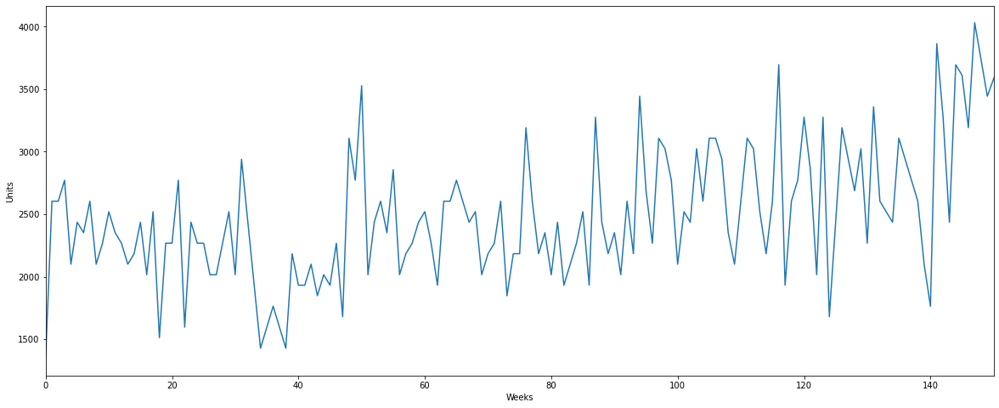

In [48]:
#Plotting the data
y_11782= df_11782.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = 150
plt.xlim(0, num_lags) 
plt.plot(y_11782)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [49]:
## Basic statistics

# Calculate
mean = np.mean(y_11782)
std = np.std(y_11782)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 2573.2
The standard deviation is: 593.0674569430096


In [50]:
# Count zeros in each column
num_zeros = y_11782.eq(0).sum()
length = len(y_11782)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  165 rows
The amount of 0's in the dataset is:  0


## 7.1 Premodeling

In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 7.2. Stationarity

First the formal test will be performed, and then the necesary number of differences will be calculated.

In [51]:
# Calculate the number of rows in the dataframe
y_11782_rows = y_11782.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_11782_rows * 0.80)

# Split the data into training and test sets
y11782_train = y_11782.iloc[:last_train_row]
y11782_test = y_11782.iloc[last_train_row:]

In [52]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y11782_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 0.08543889464077808
The series is not stationary because of the ADF test


### 7.3. Autocorrelation and partial autocorrelation

Both graphs will be checked.

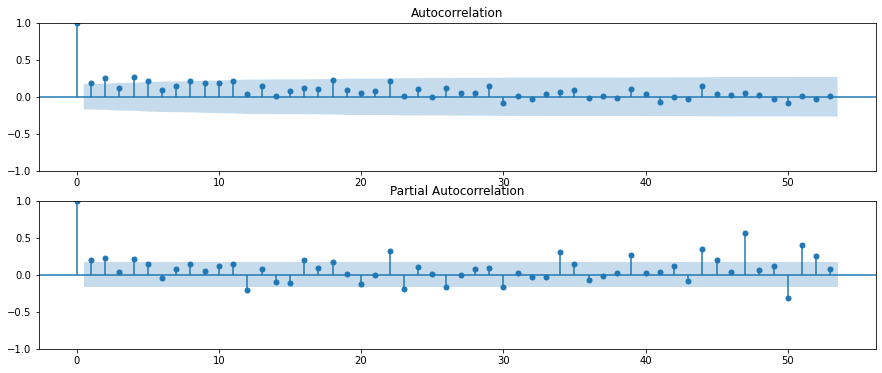

In [53]:
## Plot graphs

# Set number of lags
nlags = 53

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y11782_train, lags = nlags, ax=ax[0])
plot_pacf(y11782_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.

### 7.4 Modeling

### 7.4.1. Model: Taking differences

In [54]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y11782_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y11782_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 7.4.2. Model

                                     SARIMAX Results                                      
Dep. Variable:                              Units   No. Observations:                  132
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 52)   Log Likelihood                -620.285
Date:                            Mon, 27 Feb 2023   AIC                           1246.570
Time:                                    14:45:39   BIC                           1253.679
Sample:                                         0   HQIC                          1249.418
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5494      0.119     -4.635      0.000      -0.782      -0.317
ar.S.L52      -0.4927      0.133   

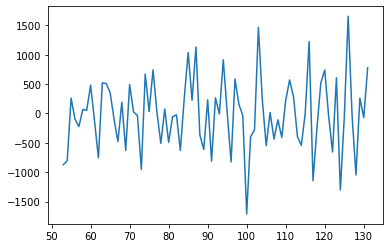

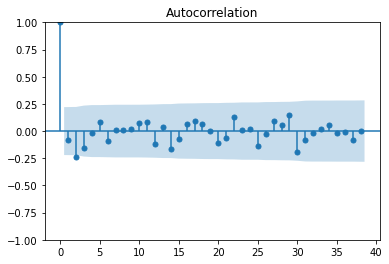

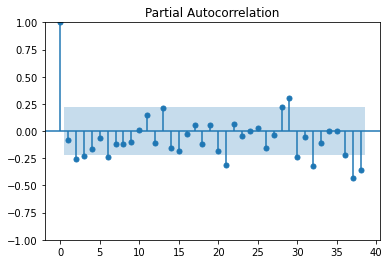

In [55]:
fit = SARIMAX(endog = y11782_train, order = (1,1,0), seasonal_order = (1,1,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=38

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9905408620834351 p-value 0.8335434794425964


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



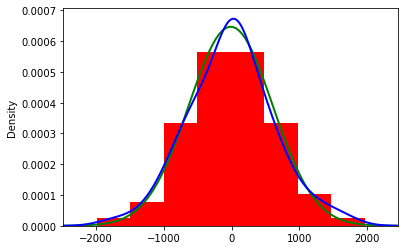

In [56]:
# Normality and residuals test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

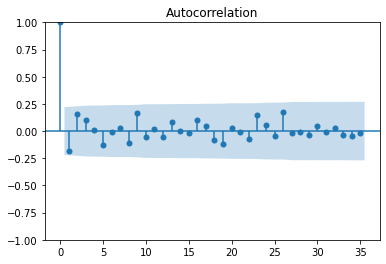

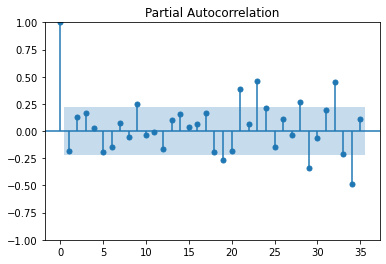

In [57]:
## ACF and PACF for square residuals
plot_acf(residuos**2,lags=35)
plt.show()
plot_pacf(residuos**2,lags=35,method="ols")
plt.show()

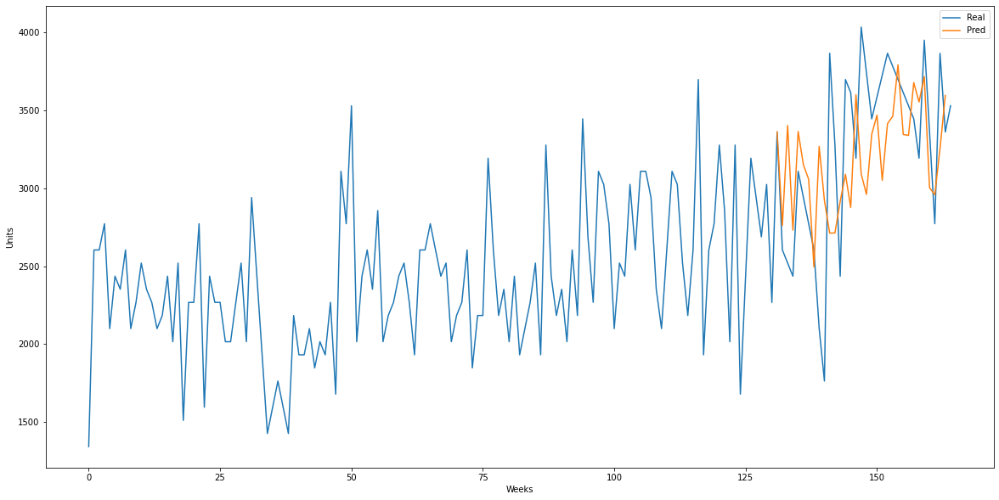

In [58]:
## Testing model

# # Plotting predictions
y_pred = fit.forecast(steps = 32)

# Putting the last real index
y_pred.loc[len(y11782_train)-1] = y11782_train[len(y11782_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

#Plotting
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_11782, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [59]:
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error

print("MAPE score: ", mean_absolute_percentage_error(y11782_test, y_pred))
print("MAE score: ", mean_absolute_error(y11782_test, y_pred))

MAPE score:  0.15661900650136834
MAE score:  466.11626678377735


### 7.4.3. Creating a prediction for the next 8 weeks

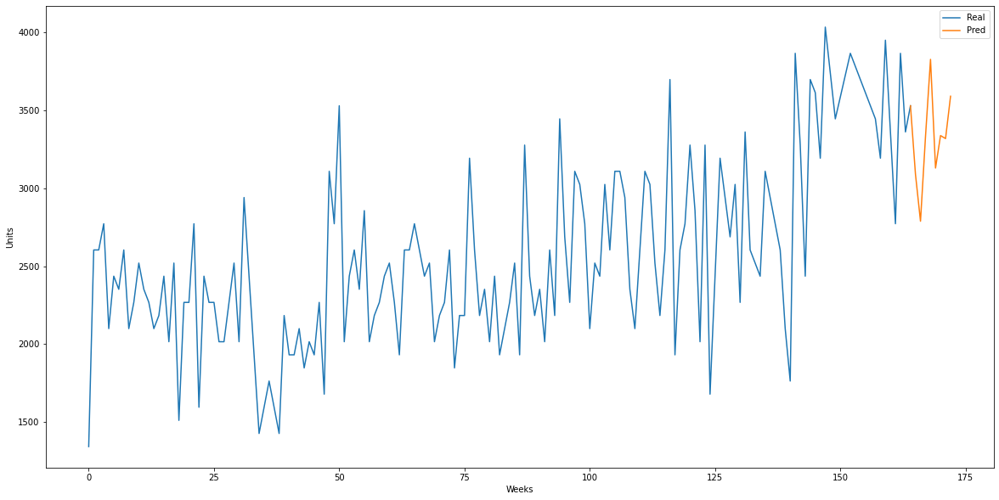

In [60]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_11782, order = (1,1,0), seasonal_order = (1,1,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_11782)-1] = y_11782[len(y_11782)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_11782, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()


In [61]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df2 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df2)

   Date  Forecast
0   164    3528.0
1   165    3088.0
2   166    2788.0
3   167    3331.0
4   168    3825.0
5   169    3129.0
6   170    3337.0
7   171    3318.0
8   172    3589.0


In [62]:
predictions2 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120011782','120011782','120011782','120011782','120011782','120011782','120011782','120011782',],
        'Forecast': [3088, 2788, 3331, 3825, 3129, 3337, 3318, 3589]}

# Create the new DataFrame
df_forecast2 = pd.DataFrame(predictions2)

# Print the new DataFrame
print(df_forecast2)

      Date ID_Material  Forecast
0  2022-40   120011782      3088
1  2022-41   120011782      2788
2  2022-42   120011782      3331
3  2022-43   120011782      3825
4  2022-44   120011782      3129
5  2022-45   120011782      3337
6  2022-46   120011782      3318
7  2022-47   120011782      3589


# 8. Model SARIMA for Item #120011556 <a id='section-8'></a>

In [63]:
#Creating a df for ID_material #120011556

df_11556 =df[df['ID_material']=='120011556']

In [64]:
#Ordering the dates ascending order

df_11556.sort_values("date", inplace=True, ascending=True)
df_11556.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,year-week,ID_material,Units
304,2019-10-05,2019-40,120011556,144
305,2019-10-12,2019-41,120011556,90
306,2019-10-19,2019-42,120011556,204
307,2019-10-26,2019-43,120011556,126
308,2019-11-02,2019-44,120011556,252


In [65]:
#We do not need the columns year-week and ID_material, so we drop them.

df_11556.drop(columns=['year-week', 'ID_material'], inplace=True)
df_11556.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,Units
304,2019-10-05,144
305,2019-10-12,90
306,2019-10-19,204
307,2019-10-26,126
308,2019-11-02,252


In [66]:
df_11556 = df_11556.reset_index(drop=True)

In [67]:
len(df_11556)

157

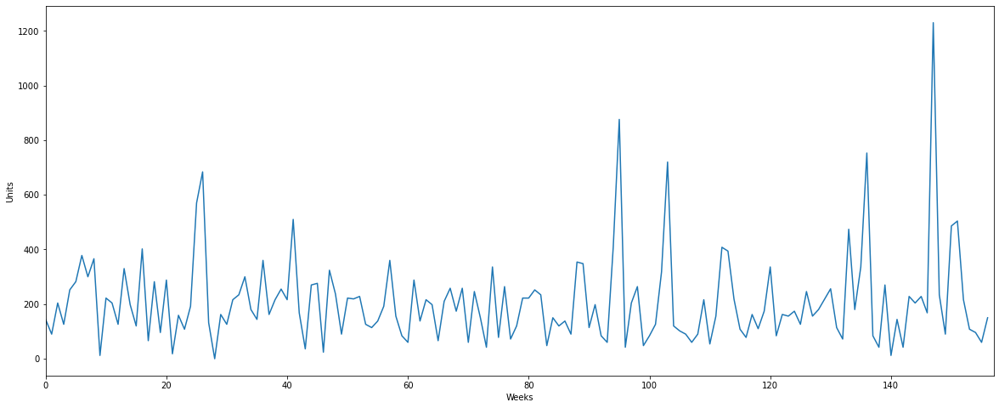

In [68]:
y_11556 = df_11556.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = 157
plt.xlim(0, num_lags) 
plt.plot(y_11556)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [69]:
## Basic statistics

# Calculate
mean = np.mean(y_11556)
std = np.std(y_11556)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 209.0
The standard deviation is: 164.1837559945687


In [70]:
# Count zeros in each column
num_zeros = y_11556.eq(0).sum()
length = len(y_11556)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  157 rows
The amount of 0's in the dataset is:  1


## 8.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 8.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [71]:
# Calculate the number of rows in the dataframe
y_11556_rows = y_11556.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_11556_rows * 0.80)

# Split the data into training and test sets
y11556_train = y_11556.iloc[:last_train_row]
y11556_test = y_11556.iloc[last_train_row:]

In [72]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y11556_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 3.953470952402931e-12
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 8.3. Autocorrelation and partial autocorrelation
Both graphs will be checked.

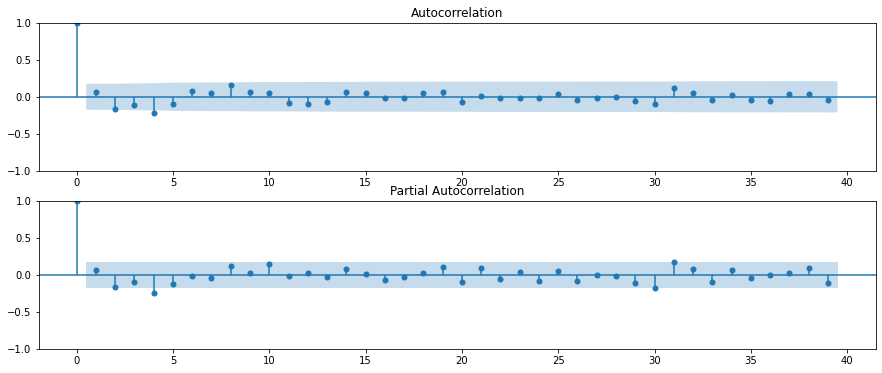

In [73]:
## Plot graphs

# Set number of lags
nlags = 39

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y11556_train, lags = nlags, ax=ax[0])
plot_pacf(y11556_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is white noise, as it does not have lags out of bounce. However, the mean is not 0, therefore not complying with the requisites for the data to be white noise. Meaning that the model can be fitted to the data.

### 8.4 Modeling

### 8.4.1. Model: Taking differences
The differences

In [74]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y11556_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y11556_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 8.4.2. Model

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                                SARIMAX Results                                 
Dep. Variable:                    Units   No. Observations:                  125
Model:             SARIMAX(2, 1, 0, 52)   Log Likelihood                -486.773
Date:                  Mon, 27 Feb 2023   AIC                            979.545
Time:                          14:45:57   BIC                            986.416
Sample:                               0   HQIC                           982.283
                                  - 125                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L52      -1.5653      0.103    -15.137      0.000      -1.768      -1.363
ar.S.L104     -0.9659      0.008   -124.316      0.000      -0.981      -0.951
sigma2      1258.5053   2.05e-06   6

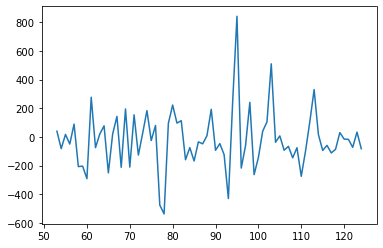

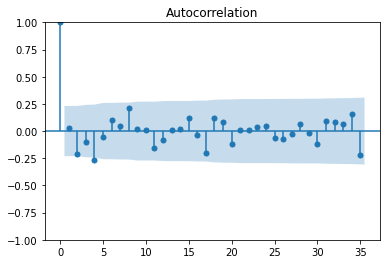

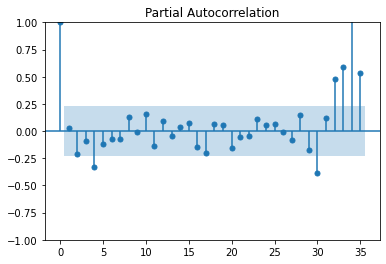

In [75]:
fit = SARIMAX(endog = y11556_train, order = (0,0,0), seasonal_order = (2,1,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=35

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9313298463821411 p-value 0.0007126448326744139


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



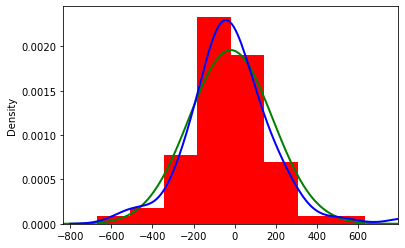

In [76]:
# Normality and residuals test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

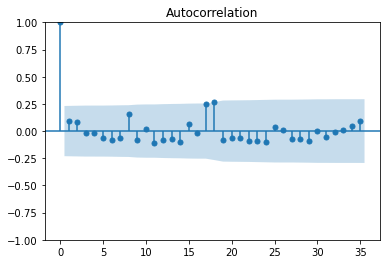

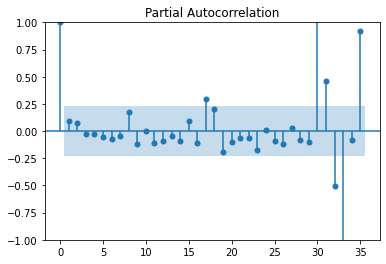

In [77]:
## ACF and PACF for square residuals
plot_acf(residuos**2,lags=35)
plt.show()
plot_pacf(residuos**2,lags=35,method="ols")
plt.show()

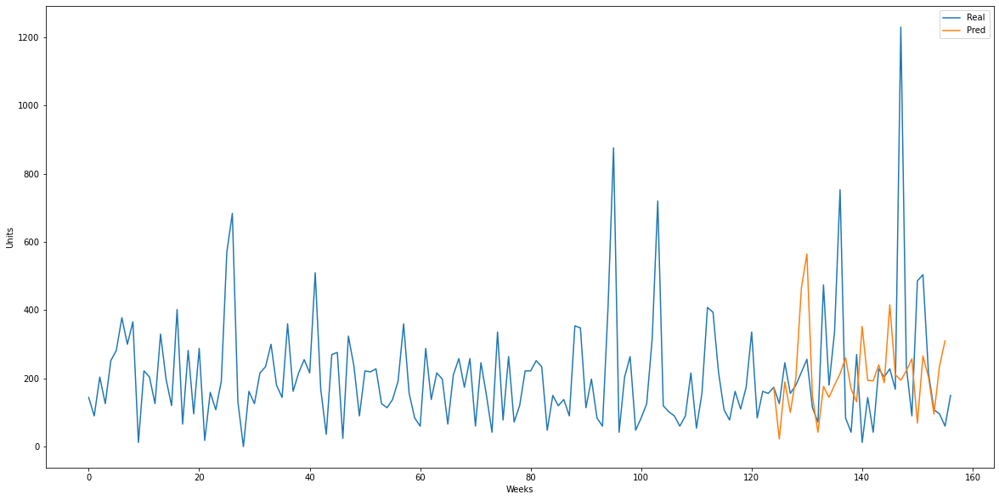

In [78]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 31)

#Putting the last real index
y_pred.loc[len(y11556_train)-1] = y11556_train[len(y11556_train)-1]

# We reset the indices, sort by index and put the index back as the Series index
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

#Plotting
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_11556, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [79]:
print("MAPE score: ", mean_absolute_percentage_error(y11556_test, y_pred))
print("MAE score: ", mean_absolute_error(y11556_test, y_pred))

MAPE score:  1.3480582426846337
MAE score:  186.31477132778326


### 8.4.3. Creating a prediction for the next 8 weeks

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



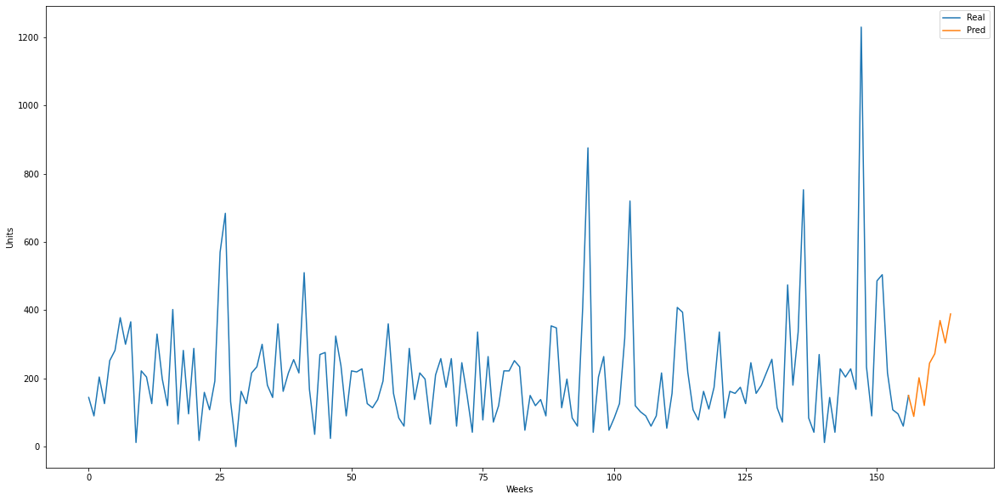

In [80]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_11556, order = (0,0,0), seasonal_order = (2,1,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_11556)-1] = y_11556[len(y_11556)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_11556, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()


In [81]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df3 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df3)

   Date  Forecast
0   156     150.0
1   157      88.0
2   158     202.0
3   159     121.0
4   160     245.0
5   161     272.0
6   162     370.0
7   163     304.0
8   164     389.0


In [82]:
predictions3 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120011556','120011556','120011556','120011556','120011556','120011556','120011556','120011556',],
        'Forecast': [89, 202, 122, 246, 274, 371, 303, 384]}

# Create the new DataFrame
df_forecast3 = pd.DataFrame(predictions3)

# Print the new DataFrame
print(df_forecast3)

      Date ID_Material  Forecast
0  2022-40   120011556        89
1  2022-41   120011556       202
2  2022-42   120011556       122
3  2022-43   120011556       246
4  2022-44   120011556       274
5  2022-45   120011556       371
6  2022-46   120011556       303
7  2022-47   120011556       384


# 9. Model SARIMA for Item #120012154 <a id='section-9'></a>

In [83]:
#Creating a df for ID_material #120012154

df_12154 =df[df['ID_material']=='120012154']

In [84]:
#Ordering the dates ascending order

df_12154.sort_values("date", inplace=True, ascending=True)
df_12154.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,year-week,ID_material,Units
1243,2020-02-15,2020-07,120012154,765
1244,2020-02-22,2020-08,120012154,2205
1245,2020-02-29,2020-09,120012154,1935
1246,2020-03-07,2020-10,120012154,2745
1247,2020-03-14,2020-11,120012154,2220


In [85]:
#We do not need the columns year-week and ID_material, so we drop them.

df_12154.drop(columns=['year-week', 'ID_material'], inplace=True)
df_12154.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,Units
1243,2020-02-15,765
1244,2020-02-22,2205
1245,2020-02-29,1935
1246,2020-03-07,2745
1247,2020-03-14,2220


In [86]:
df_12154 = df_12154.reset_index(drop=True)

In [87]:
len(df_12154)

138

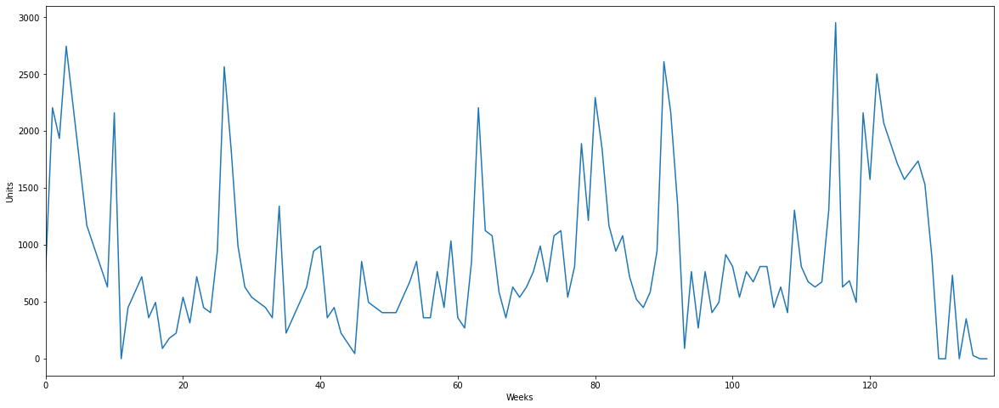

In [88]:
y_12154 = df_12154.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = 138
plt.xlim(0, num_lags) 
plt.plot(y_12154)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [89]:
## Basic statistics

# Calculate
mean = np.mean(y_12154)
std = np.std(y_12154)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 873.3478260869565
The standard deviation is: 655.4530201514893


In [90]:
# Count zeros in each column
num_zeros = y_12154.eq(0).sum()
length = len(y_12154)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  138 rows
The amount of 0's in the dataset is:  6


## 9.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 9.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [91]:
# Calculate the number of rows in the dataframe
y_12154_rows = y_12154.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_12154_rows * 0.80)

# Split the data into training and test sets
y12154_train = y_12154.iloc[:last_train_row]
y12154_test = y_12154.iloc[last_train_row:]

In [92]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y12154_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 6.64747904283482e-07
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 9.3. Autocorrelation and partial autocorrelation
Both graphs will be checked.

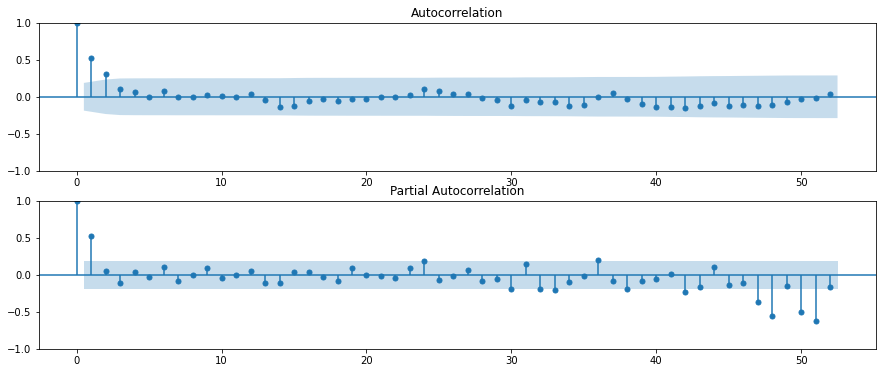

In [93]:
## Plot graphs

# Set number of lags
nlags = 52

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y12154_train, lags = nlags, ax=ax[0])
plot_pacf(y12154_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.

### 9.4 Modeling

### 9.4.1. Model: Taking differences
The differences

In [94]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y12154_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y12154_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 9.4.2. Model

                               SARIMAX Results                                
Dep. Variable:                  Units   No. Observations:                  110
Model:               SARIMAX(5, 1, 0)   Log Likelihood                -837.400
Date:                Mon, 27 Feb 2023   AIC                           1686.801
Time:                        14:46:16   BIC                           1702.949
Sample:                             0   HQIC                          1693.350
                                - 110                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3871      0.089     -4.357      0.000      -0.561      -0.213
ar.L2         -0.2531      0.106     -2.381      0.017      -0.462      -0.045
ar.L3         -0.3235      0.116     -2.780      0.0

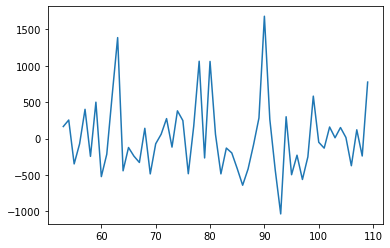

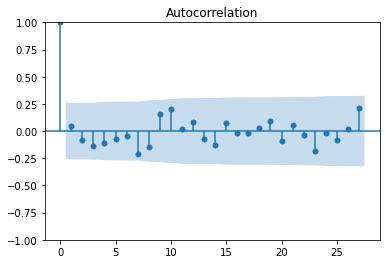

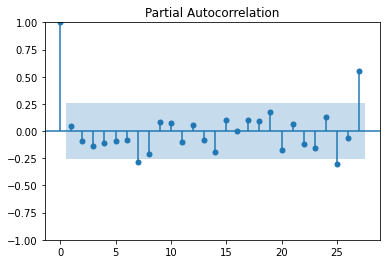

In [95]:
fit = SARIMAX(endog = y12154_train, order = (5,1,0), seasonal_order = (0,0,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=27

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9262239933013916 p-value 0.001885816571302712


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



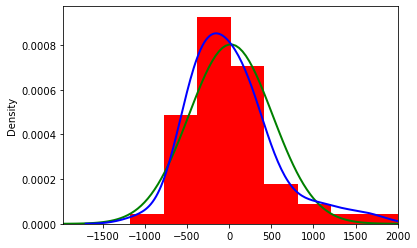

In [96]:
# Normality and residuals test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

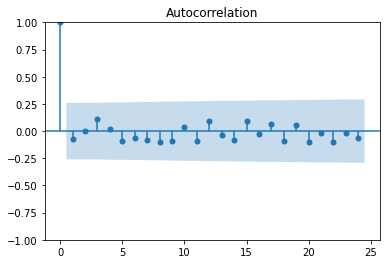

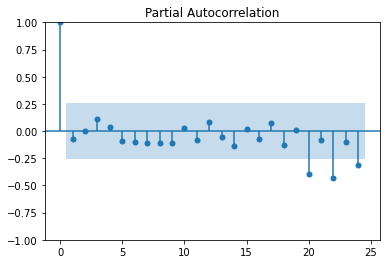

In [97]:
## ACF and PACF for square residuals

plot_acf(residuos**2,lags=24)
plt.show()
plot_pacf(residuos**2,lags=24,method="ols")
plt.show()

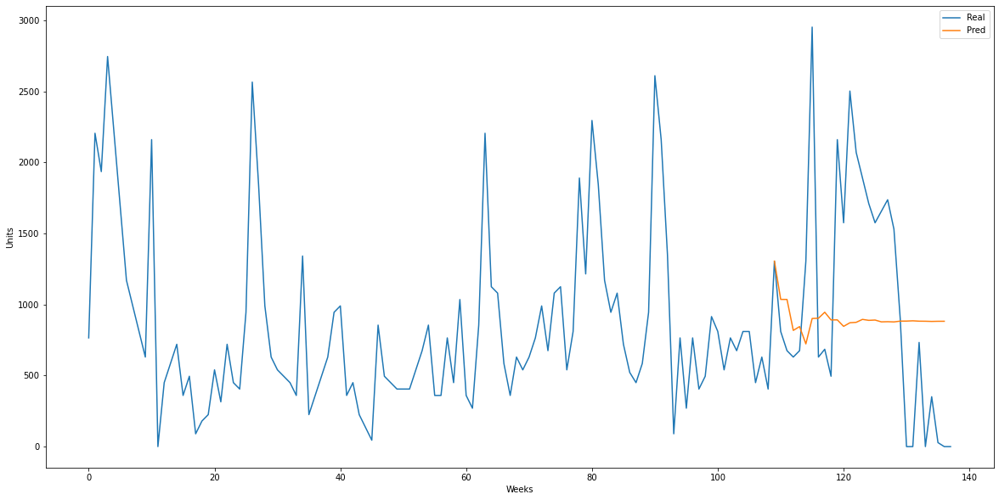

In [98]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 27)

# Putting the last real index
y_pred.loc[len(y12154_train)-1] = y12154_train[len(y12154_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

# Plotting
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_12154, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [99]:
print("MAPE score: ", mean_absolute_percentage_error(y12154_test, y_pred))
print("MAE score : ", mean_absolute_error(y12154_test, y_pred))

MAPE score:  7.097197977730162e+17
MAE score :  735.8774883185034


In [100]:
wape = (y12154_test - y_pred).abs().sum() / y12154_test.sum()
print(wape)

predicted_mean    0.0
110               0.0
111               0.0
112               0.0
113               0.0
114               0.0
115               0.0
116               0.0
117               0.0
118               0.0
119               0.0
120               0.0
121               0.0
122               0.0
123               0.0
124               0.0
125               0.0
126               0.0
127               0.0
128               0.0
129               0.0
130               0.0
131               0.0
132               0.0
133               0.0
134               0.0
135               0.0
136               0.0
137               0.0
dtype: float64


### 9.4.3. Creating a prediction for the next 8 weeks

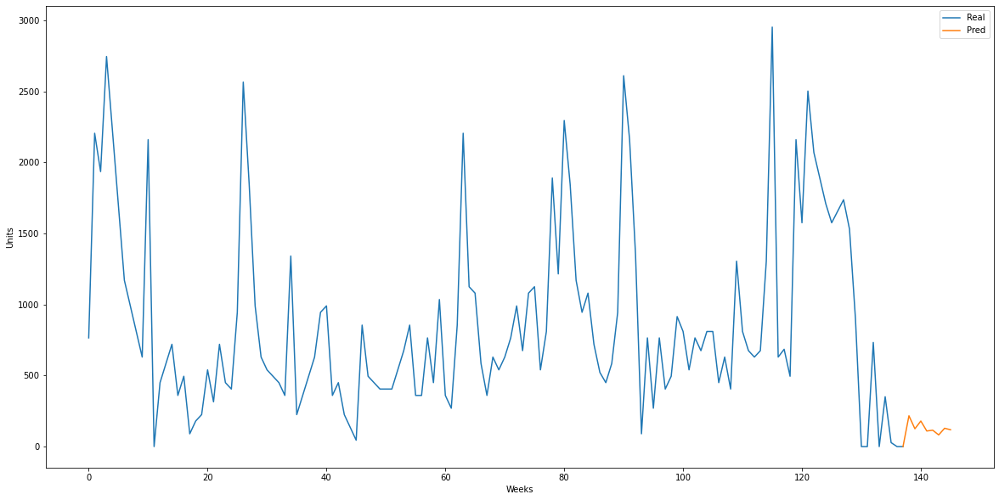

In [101]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_12154, order = (5,1,0), seasonal_order = (0,0,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_12154)-1] = y_12154[len(y_12154)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_12154, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()


In [102]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df4 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df4)

   Date  Forecast
0   137       0.0
1   138     217.0
2   139     126.0
3   140     180.0
4   141     110.0
5   142     115.0
6   143      82.0
7   144     129.0
8   145     119.0


In [103]:
predictions4 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120012154','120012154','120012154','120012154','120012154','120012154','120012154','120012154',],
        'Forecast': [217, 126, 180, 110, 115, 82, 129, 119]}

# Create the new DataFrame
df_forecast4 = pd.DataFrame(predictions4)

# Print the new DataFrame
print(df_forecast4)

      Date ID_Material  Forecast
0  2022-40   120012154       217
1  2022-41   120012154       126
2  2022-42   120012154       180
3  2022-43   120012154       110
4  2022-44   120012154       115
5  2022-45   120012154        82
6  2022-46   120012154       129
7  2022-47   120012154       119


# 10. Model SARIMA for Item #120010566 <a id='section-10'></a>

In [104]:
#Creating a df for ID_material #120010566

df_10566 =df[df['ID_material']=='120010566']

In [105]:
#Ordering the dates ascending order

df_10566.sort_values("date", inplace=True, ascending=True)
#We do not need the columns year-week and ID_material, so we drop them.df_10566.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [106]:
#We do not need the columns year-week and ID_material, so we drop them.

df_10566.drop(columns=['year-week', 'ID_material'], inplace=True)
df_10566.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,Units
461,2018-08-04,5256
462,2018-08-11,0
463,2018-08-18,8316
464,2018-08-25,672
465,2018-09-01,1680


In [107]:
df_10566 = df_10566.reset_index(drop=True)

In [108]:
len(df_10566)

218

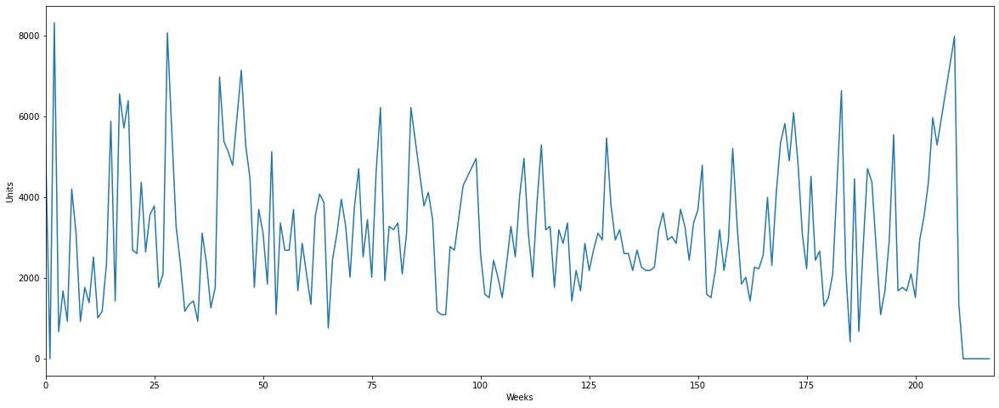

In [109]:
y_10566 = df_10566.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = 218
plt.xlim(0, num_lags) 
plt.plot(y_10566)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [110]:
## Basic statistics

# Calculate
mean = np.mean(y_10566)
std = np.std(y_10566)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 3103.7844036697247
The standard deviation is: 1691.747555921912


In [111]:
# Count zeros in each column
num_zeros = y_10566.eq(0).sum()
length = len(y_10566)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  218 rows
The amount of 0's in the dataset is:  8


## 10.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 10.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [112]:
# Calculate the number of rows in the dataframe
y_10566_rows = y_10566.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_10566_rows * 0.80)

# Split the data into training and test sets
y10566_train = y_10566.iloc[:last_train_row]
y10566_test = y_10566.iloc[last_train_row:]

In [113]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y10566_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 1.1445878131812434e-07
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 10.3. Autocorrelation and partial autocorrelation
Both graphs will be checked.

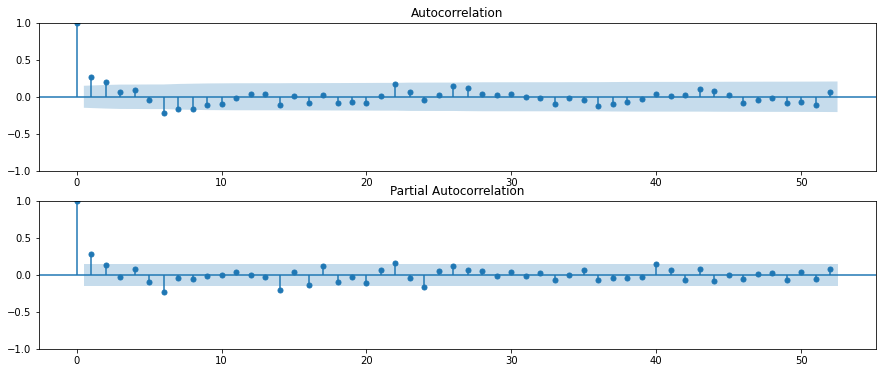

In [114]:
## Plot graphs

# Set number of lags
nlags = 52

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y10566_train, lags = nlags, ax=ax[0])
plot_pacf(y10566_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.

### 10.4 Modeling

### 10.4.1. Model: Taking differences
The differences

In [115]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y10566_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y10566_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 10.4.2. Model

                                SARIMAX Results                                 
Dep. Variable:                    Units   No. Observations:                  174
Model:             SARIMAX(2, 1, 0, 52)   Log Likelihood               -1080.500
Date:                  Mon, 27 Feb 2023   AIC                           2167.000
Time:                          14:46:20   BIC                           2175.412
Sample:                               0   HQIC                          2170.417
                                  - 174                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L52      -0.4417      0.096     -4.607      0.000      -0.630      -0.254
ar.S.L104     -0.2617      0.112     -2.330      0.020      -0.482      -0.042
sigma2      3.169e+06   4.68e+05    

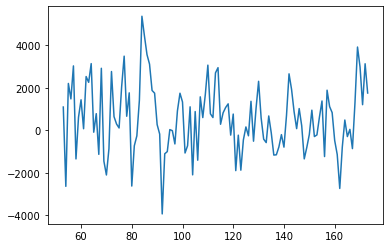

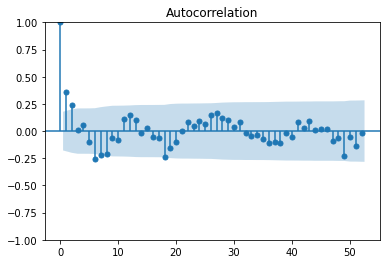

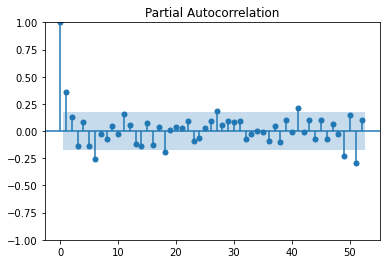

In [116]:
fit = SARIMAX(endog = y10566_train, order = (0,0,0), seasonal_order = (2,1,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=52

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9930877089500427 p-value 0.8154542446136475


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



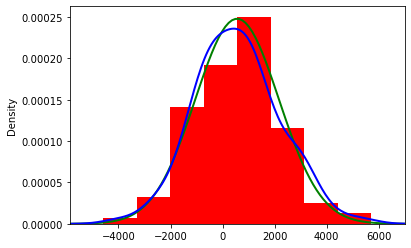

In [117]:
# Normality and residuals test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

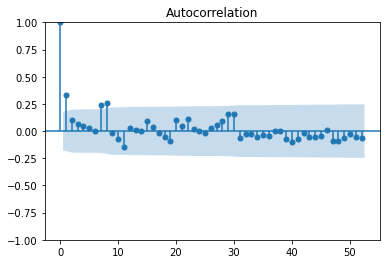

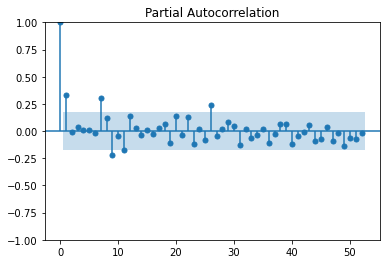

In [118]:
## ACF and PACF for square residuals

plot_acf(residuos**2,lags=52)
plt.show()
plot_pacf(residuos**2,lags=52,method="ols")
plt.show()

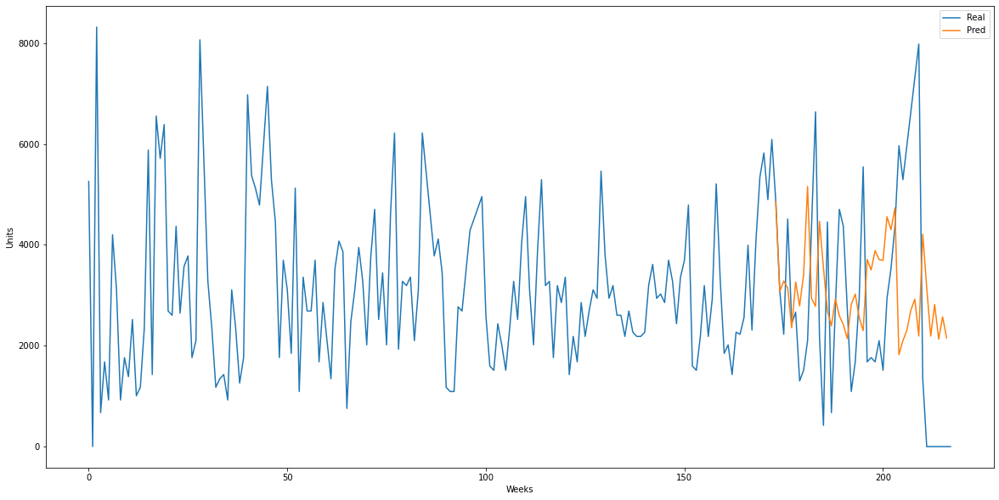

In [119]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 43)

# Putting the last real index
y_pred.loc[len(y10566_train)-1] = y10566_train[len(y10566_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

# Plotting
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_10566, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [120]:
print("MAPE score: ", mean_absolute_percentage_error(y10566_test, y_pred))
print("MAE score: ", mean_absolute_error(y10566_test, y_pred))

MAPE score:  1.9672796568538668e+18
MAE score:  1905.143941521531


### 10.4.3. Creating a prediction for the next 8 weeks

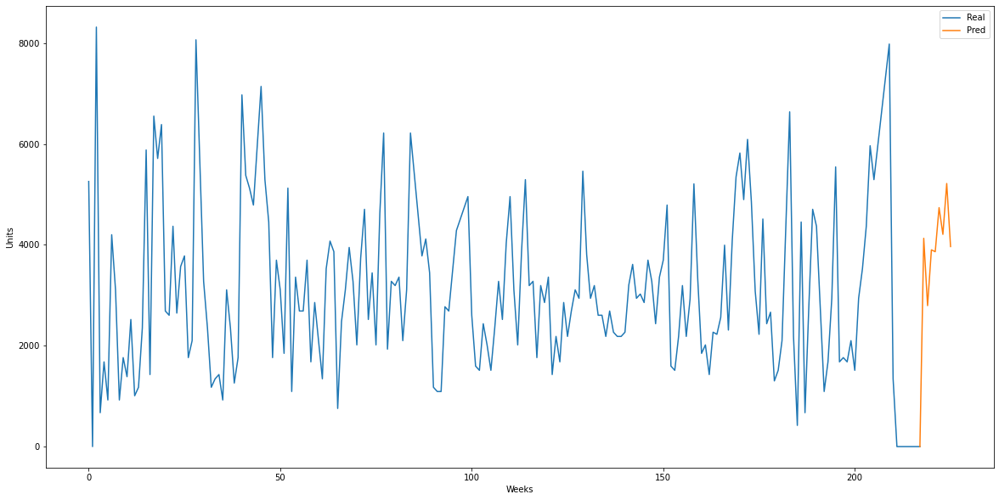

In [121]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_10566, order = (0,0,0), seasonal_order = (2,1,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_10566)-1] = y_10566[len(y_10566)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_10566, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()


In [122]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df5 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df5)

   Date  Forecast
0   217       0.0
1   218    4130.0
2   219    2795.0
3   220    3901.0
4   221    3863.0
5   222    4737.0
6   223    4207.0
7   224    5215.0
8   225    3966.0


In [123]:
predictions5 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120010566','120010566','120010566','120010566','120010566','120010566','120010566','120010566',],
        'Forecast': [4130, 2795, 3901, 3863, 4737, 4207, 5215, 3966]}

# Create the new DataFrame
df_forecast5 = pd.DataFrame(predictions5)

# Print the new DataFrame
print(df_forecast5)

      Date ID_Material  Forecast
0  2022-40   120010566      4130
1  2022-41   120010566      2795
2  2022-42   120010566      3901
3  2022-43   120010566      3863
4  2022-44   120010566      4737
5  2022-45   120010566      4207
6  2022-46   120010566      5215
7  2022-47   120010566      3966


# 11. Model SARIMA for Item #120010342 <a id='section-11'></a>

In [124]:
#Creating a df for ID_material #120010342

df_10342 =df[df['ID_material']=='120010342']

In [125]:
#Ordering the dates ascending order

df_10342.sort_values("date", inplace=True, ascending=True)

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [126]:
#We do not need the columns year-week and ID_material, so we drop them.

df_10342.drop(columns=['year-week', 'ID_material'], inplace=True)
df_10342.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,Units
679,2018-05-05,480
680,2018-05-12,900
681,2018-05-19,240
682,2018-05-26,570
683,2018-06-02,900


In [127]:
df_10342 = df_10342.reset_index(drop=True)

In [128]:
len(df_10342)

231

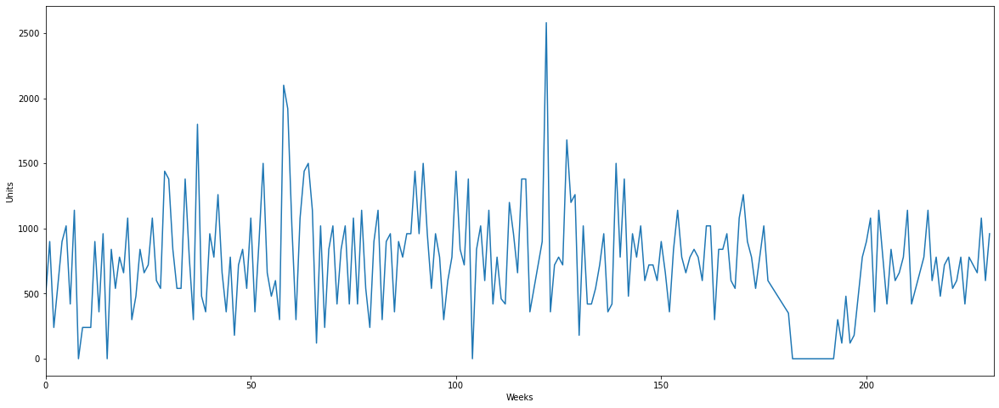

In [129]:
y_10342 = df_10342.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = 231
plt.xlim(0, num_lags) 
plt.plot(y_10342)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [130]:
## Basic statistics

# Calculate
mean = np.mean(y_10342)
std = np.std(y_10342)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 728.4848484848485
The standard deviation is: 407.1427719896529


In [131]:
# Count zeros in each column
num_zeros = y_10342.eq(0).sum()
length = len(y_10342)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  231 rows
The amount of 0's in the dataset is:  14


## 11.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 11.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [132]:
# Calculate the number of rows in the dataframe
y_10342_rows = y_10342.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_10342_rows * 0.80)

# Split the data into training and test sets
y10342_train = y_10342.iloc[:last_train_row]
y10342_test = y_10342.iloc[last_train_row:]

In [133]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y10342_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 0.0003601120783267942
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 11.3. Autocorrelation and partial autocorrelation
Both graphs will be checked.

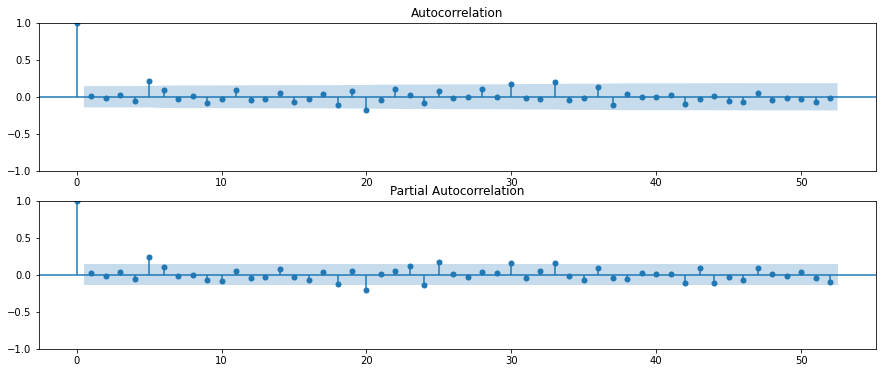

In [134]:
## Plot graphs

# Set number of lags
nlags = 52

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y10342_train, lags = nlags, ax=ax[0])
plot_pacf(y10342_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.

### 11.4 Modeling

### 11.4.1. Model: Taking differences
The differences

In [135]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y10342_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y10342_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  1
Number of seasonal differences to take:  0


### 11.4.2. Model

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                                      SARIMAX Results                                       
Dep. Variable:                                Units   No. Observations:                  184
Model:             SARIMAX(4, 1, 0)x(0, 1, [1], 52)   Log Likelihood               -1004.081
Date:                              Mon, 27 Feb 2023   AIC                           2020.162
Time:                                      14:46:44   BIC                           2037.414
Sample:                                           0   HQIC                          2027.172
                                              - 184                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8434      0.088     -9.606      0.000      -1.015      -0.671
ar.L2         -0.72

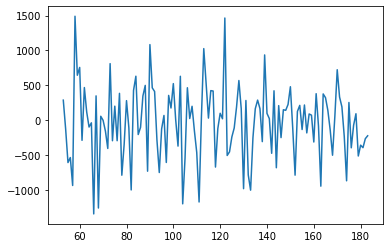

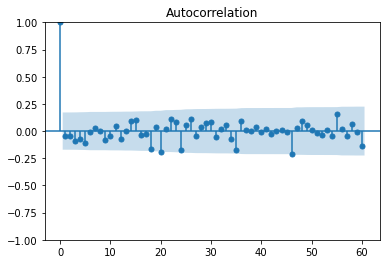

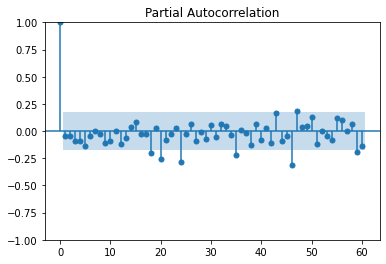

In [136]:
fit = SARIMAX(endog = y10342_train, order = (4,1,0), seasonal_order = (0,1,1,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=60

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.987156093120575 p-value 0.25974446535110474


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



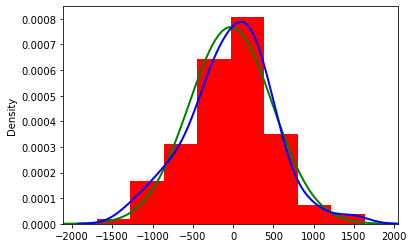

In [137]:
# Normality and residuals test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

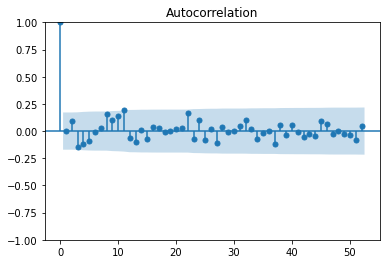

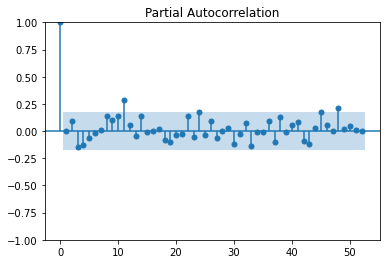

In [138]:
## ACF and PACF for square residuals

plot_acf(residuos**2,lags=52)
plt.show()
plot_pacf(residuos**2,lags=52,method="ols")
plt.show()

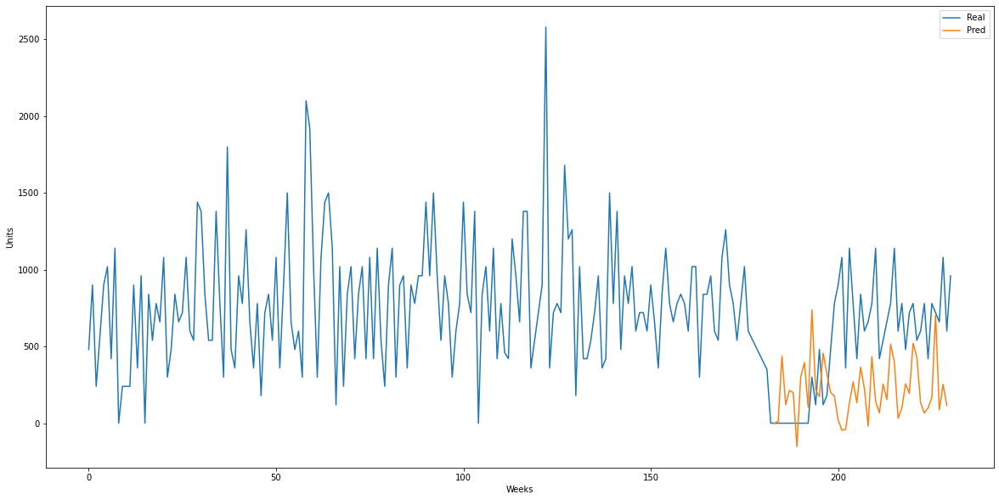

In [139]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 46)

# Putting the last real index
y_pred.loc[len(y10342_train)-1] = y10342_train[len(y10342_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

# Plotting
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_10342, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [140]:
print("MAPE score: ", mean_absolute_percentage_error(y10342_test, y_pred))
print("MAE score: " ,mean_absolute_error(y10342_test, y_pred))

MAPE score:  1.753377973760281e+17
MAE score:  435.49087986006913


### 11.4.3. Creating a prediction for the next 8 weeks

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning:

Non-invertible starting seasonal moving average Using zeros as starting parameters.

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



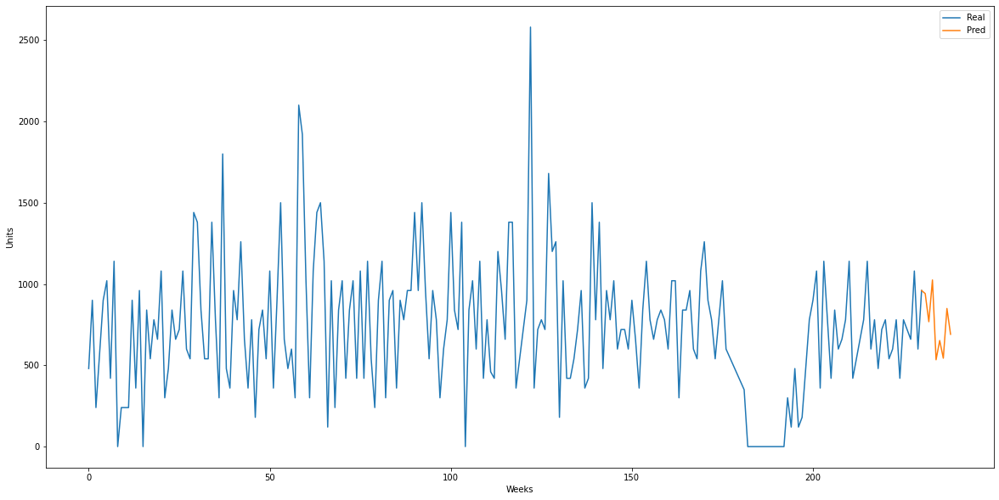

In [141]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_10342, order = (4,1,0), seasonal_order = (0,1,1,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_10342)-1] = y_10342[len(y_10342)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_10342, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()


In [142]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df6 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df6)

   Date  Forecast
0   230     960.0
1   231     941.0
2   232     768.0
3   233    1025.0
4   234     534.0
5   235     653.0
6   236     544.0
7   237     849.0
8   238     691.0


In [143]:
predictions6 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120010342','120010342','120010342','120010342','120010342','120010342','120010342','120010342',],
        'Forecast': [941, 768, 1025, 534, 653, 544, 849, 691]}

# Create the new DataFrame
df_forecast6 = pd.DataFrame(predictions6)

# Print the new DataFrame
print(df_forecast6)

      Date ID_Material  Forecast
0  2022-40   120010342       941
1  2022-41   120010342       768
2  2022-42   120010342      1025
3  2022-43   120010342       534
4  2022-44   120010342       653
5  2022-45   120010342       544
6  2022-46   120010342       849
7  2022-47   120010342       691


# 12. Model SARIMA for Item #120009814 <a id='section-12'></a>

In [144]:
#Creating a df for ID_material #120009814

df_9814 =df[df['ID_material']=='120009814']

In [145]:
#Ordering the dates ascending order

df_9814.sort_values("date", inplace=True, ascending=True)
df_9814.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,year-week,ID_material,Units
910,2018-04-21,2018-16,120009814,468
911,2018-04-28,2018-17,120009814,624
912,2018-05-05,2018-18,120009814,156
913,2018-05-12,2018-19,120009814,0
914,2018-05-19,2018-20,120009814,624


In [146]:
#We do not need the columns year-week and ID_material, so we drop them.

df_9814.drop(columns=['year-week', 'ID_material'], inplace=True)
df_9814.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,Units
910,2018-04-21,468
911,2018-04-28,624
912,2018-05-05,156
913,2018-05-12,0
914,2018-05-19,624


In [147]:
df_9814 = df_9814.reset_index(drop=True)

In [148]:
len(df_9814)

233

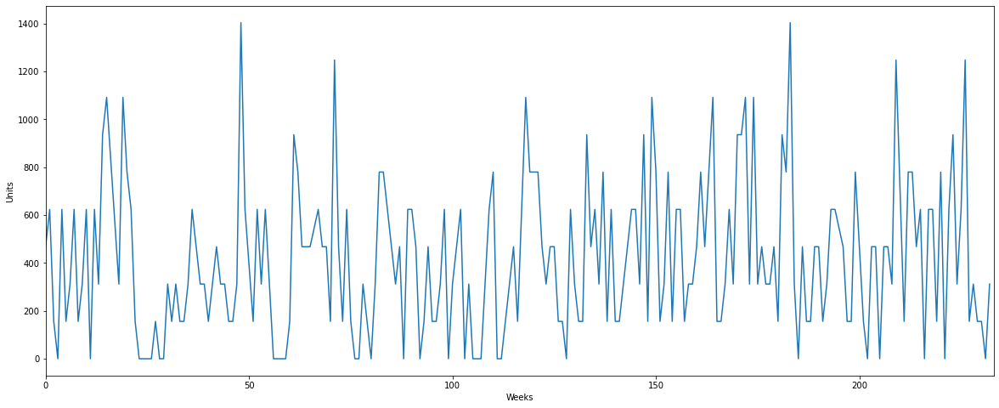

In [149]:
y_9814 = df_9814.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = 233
plt.xlim(0, num_lags) 
plt.plot(y_9814)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [150]:
## Basic statistics

# Calculate
mean = np.mean(y_9814)
std = np.std(y_9814)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 417.1158798283262
The standard deviation is: 311.8491840786057


In [151]:
# Count zeros in each column
num_zeros = y_9814.eq(0).sum()
length = len(y_9814)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  233 rows
The amount of 0's in the dataset is:  31


## 11.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 11.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [152]:
# Calculate the number of rows in the dataframe
y_9814_rows = y_9814.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_9814_rows * 0.80)

# Split the data into training and test sets
y9814_train = y_9814.iloc[:last_train_row]
y9814_test = y_9814.iloc[last_train_row:]

In [153]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y9814_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 2.991218555238373e-18
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 11.3. Autocorrelation and partial autocorrelation
Both graphs will be checked.

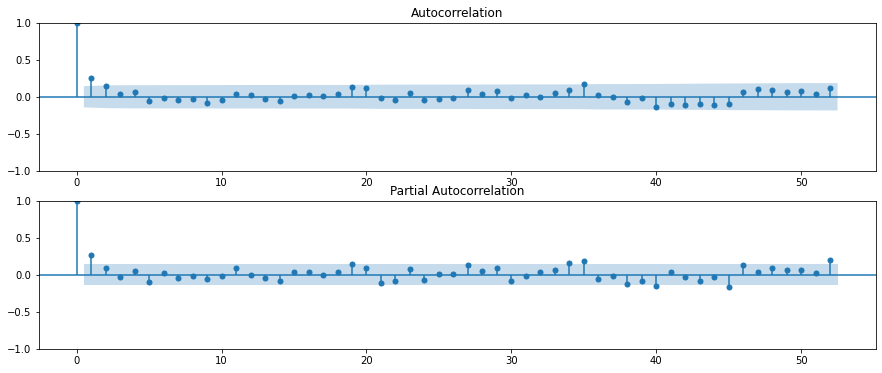

In [154]:
## Plot graphs

# Set number of lags
nlags = 52

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y9814_train, lags = nlags, ax=ax[0])
plot_pacf(y9814_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.



### 11.4 Modeling

### 11.4.1. Model: Taking differences
The differences

In [155]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y9814_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y9814_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 11.4.2. Model 

                                      SARIMAX Results                                      
Dep. Variable:                               Units   No. Observations:                  186
Model:             SARIMAX(0, 0, 1)x(2, 1, [], 52)   Log Likelihood                -983.860
Date:                             Mon, 27 Feb 2023   AIC                           1975.721
Time:                                     14:47:10   BIC                           1987.312
Sample:                                          0   HQIC                          1980.431
                                             - 186                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.1791      0.106      1.697      0.090      -0.028       0.386
ar.S.L52      -0.4236      

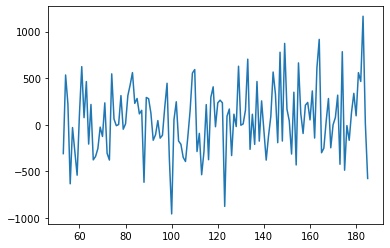

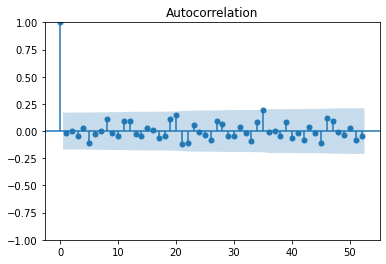

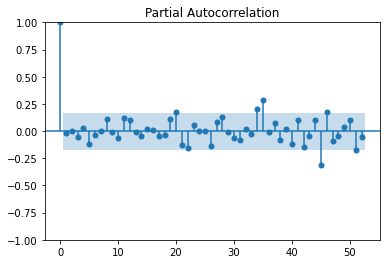

In [156]:
fit = SARIMAX(endog = y9814_train, order = (0,0,1), seasonal_order = (2,1,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=52

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9952635169029236 p-value 0.9422100186347961


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



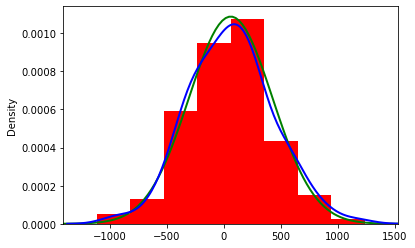

In [157]:
# Normality and residual test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

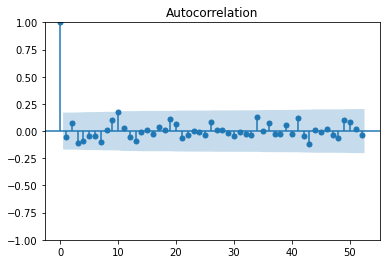

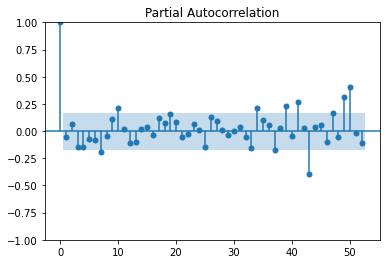

In [158]:
## ACF and PACF for square residuals

plot_acf(residuos**2,lags=52)
plt.show()
plot_pacf(residuos**2,lags=52,method="ols")
plt.show()

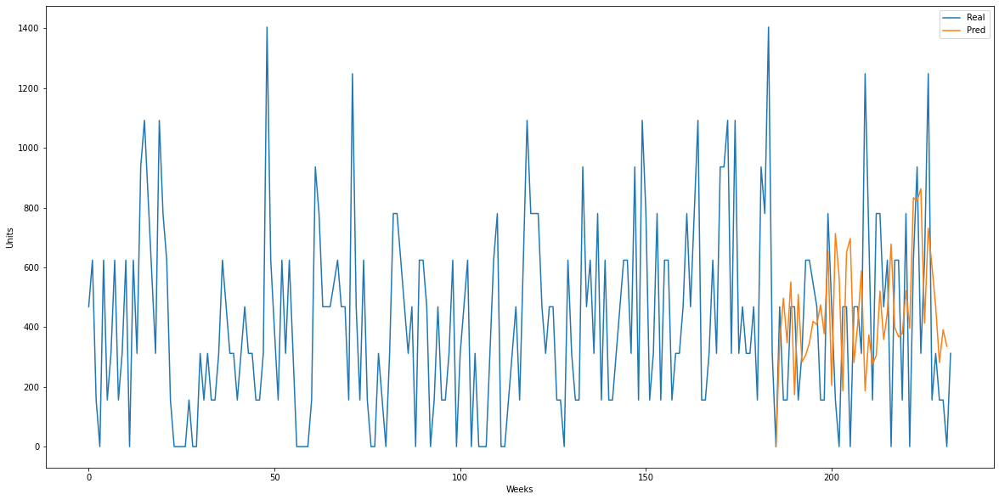

In [159]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 46)

# Putting the last real index
y_pred.loc[len(y9814_train)-1] = y9814_train[len(y9814_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

# Plotting
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_9814, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [160]:
print("MAPE score: ", mean_absolute_percentage_error(y9814_test, y_pred))
print("MAE score: ", mean_absolute_error(y9814_test, y_pred))

MAPE score:  2.6130879897581024e+17
MAE score:  297.38601813256605


### 11.4.3. Creating a prediction for the next 8 weeks

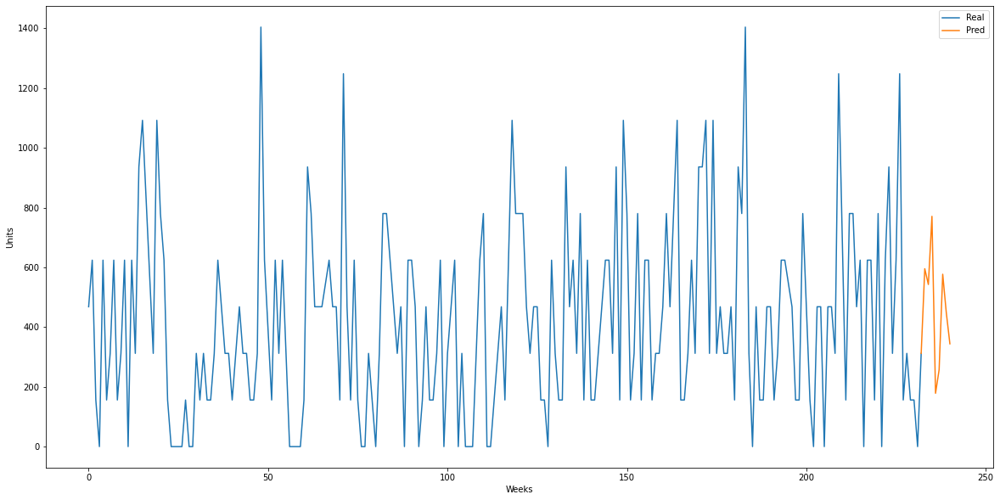

In [161]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_9814, order = (0,0,1), seasonal_order = (2,1,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_9814)-1] = y_9814[len(y_9814)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_9814, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()


In [162]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df7 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df7)

   Date  Forecast
0   232     312.0
1   233     595.0
2   234     543.0
3   235     771.0
4   236     178.0
5   237     257.0
6   238     577.0
7   239     448.0
8   240     344.0


In [163]:
predictions7 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120009814','120009814','120009814','120009814','120009814','120009814','120009814','120009814',],
        'Forecast': [595, 543, 771, 178, 257, 577, 448, 344]}

# Create the new DataFrame
df_forecast7 = pd.DataFrame(predictions7)

# Print the new DataFrame
print(df_forecast7)

      Date ID_Material  Forecast
0  2022-40   120009814       595
1  2022-41   120009814       543
2  2022-42   120009814       771
3  2022-43   120009814       178
4  2022-44   120009814       257
5  2022-45   120009814       577
6  2022-46   120009814       448
7  2022-47   120009814       344


# 13. Model SARIMA for Item #120004096 <a id='section-13'></a>

In [164]:
#Creating a df for ID_material #120004096 

df_4096 =df[df['ID_material']=='120004096']

In [165]:
#Ordering the dates ascending order

df_4096.sort_values("date", inplace=True, ascending=True)
df_4096.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,year-week,ID_material,Units
1381,2017-01-14,2017-02,120004096,120
1382,2017-01-21,2017-03,120004096,120
1383,2017-01-28,2017-04,120004096,300
1384,2017-02-04,2017-05,120004096,60
1385,2017-02-11,2017-06,120004096,120


In [166]:
#We do not need the columns year-week and ID_material, so we drop them

df_4096.drop(columns=['year-week', 'ID_material'], inplace=True)

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [167]:
df_4096 = df_4096.reset_index(drop=True)

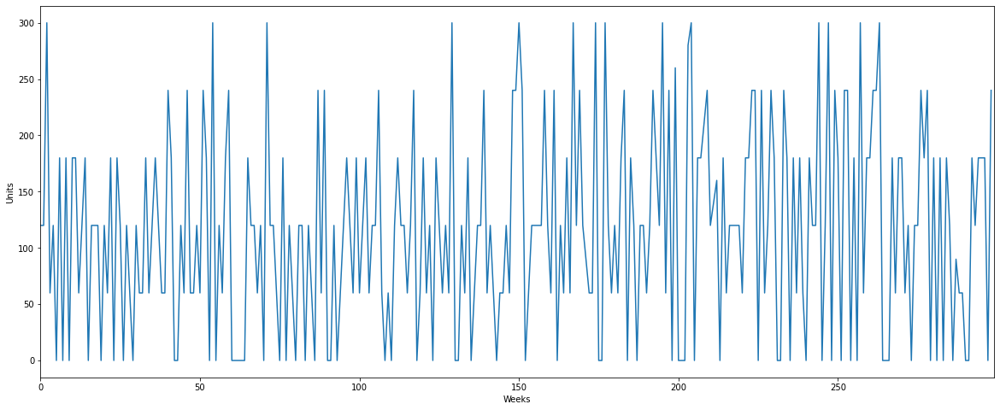

In [168]:
y_4096 = df_4096.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = len(y_4096)
plt.xlim(0, num_lags) 
plt.plot(y_4096)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel ('Units')
plt.show()

In [169]:
## Basic statistics

# Calculate
mean = np.mean(y_4096)
std = np.std(y_4096)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 114.2809364548495
The standard deviation is: 87.92898474899654


In [170]:
# Count zeros in each column
num_zeros = y_4096.eq(0).sum()
length = len(y_4096)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  299 rows
The amount of 0's in the dataset is:  67


## 13.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 13.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [171]:
# Calculate the number of rows in the dataframe
y_4096_rows = y_4096.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_4096_rows * 0.80)

# Split the data into training and test sets
y4096_train = y_4096.iloc[:last_train_row]
y4096_test = y_4096.iloc[last_train_row:]

In [172]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y4096_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 2.5947165006936913e-30
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 13.3. Autocorrelation and partial autocorrelation
Both graphs will be checked.

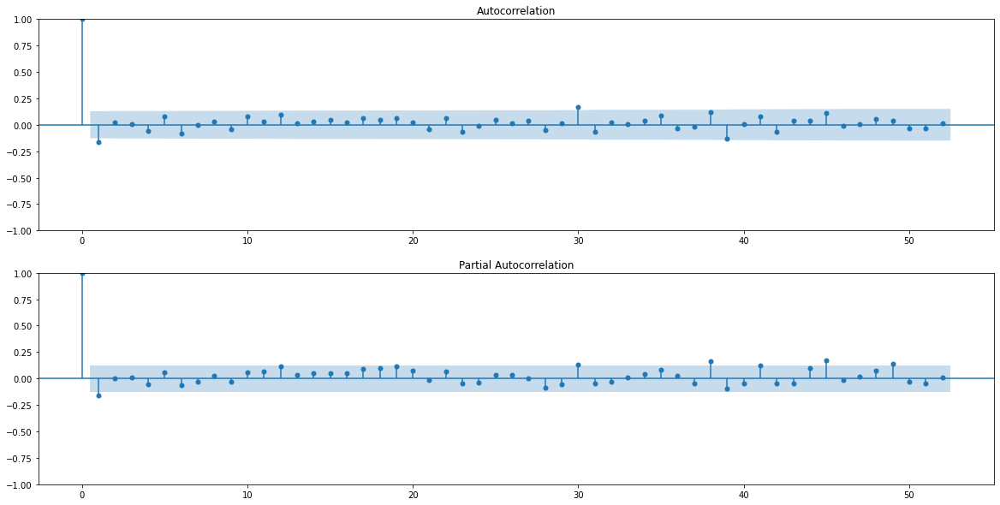

In [173]:
## Plot graphs

# Set number of lags
nlags = 52

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (20,10))

# Actually produce plots
plot_acf(y4096_train, lags = nlags, ax=ax[0])
plot_pacf(y4096_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.

### 13.4 Modeling

### 13.4.1. Model: Taking differences
The differences

In [174]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y4096_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y4096_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 13.4.2. Model

                                     SARIMAX Results                                      
Dep. Variable:                              Units   No. Observations:                  239
Model:             SARIMAX(1, 0, 0)x(0, 1, 0, 52)   Log Likelihood               -1156.644
Date:                            Mon, 27 Feb 2023   AIC                           2317.288
Time:                                    14:47:21   BIC                           2323.750
Sample:                                         0   HQIC                          2319.907
                                            - 239                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1768      0.070     -2.520      0.012      -0.314      -0.039
sigma2      1.386e+04   1418.567   

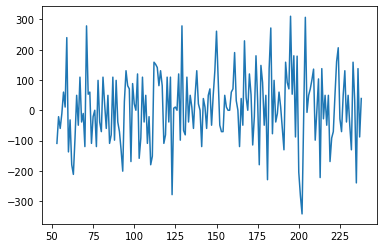

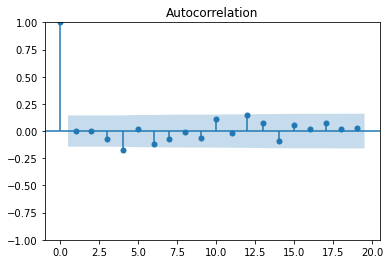

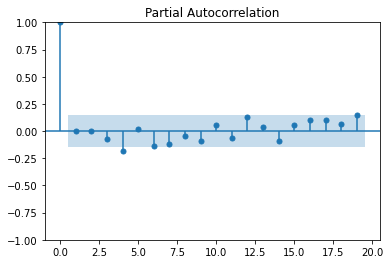

In [175]:
fit = SARIMAX(endog = y4096_train, order = (1,0,0), seasonal_order = (0,1,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=19

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9943758249282837 p-value 0.7077611684799194


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



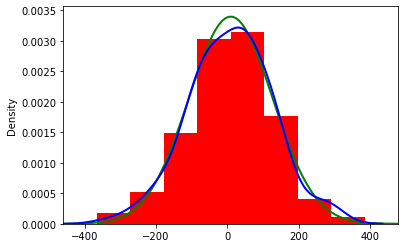

In [176]:
# Normality and residual test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

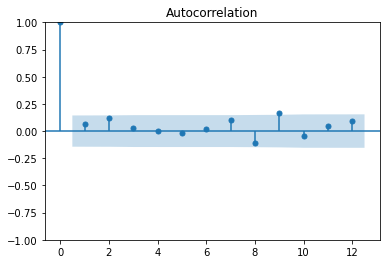

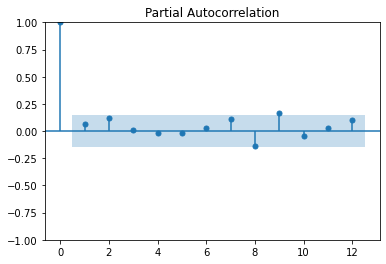

In [177]:
## ACF and PACF for square residuals
plot_acf(residuos**2,lags=12)
plt.show()
plot_pacf(residuos**2,lags=12,method="ols")
plt.show()

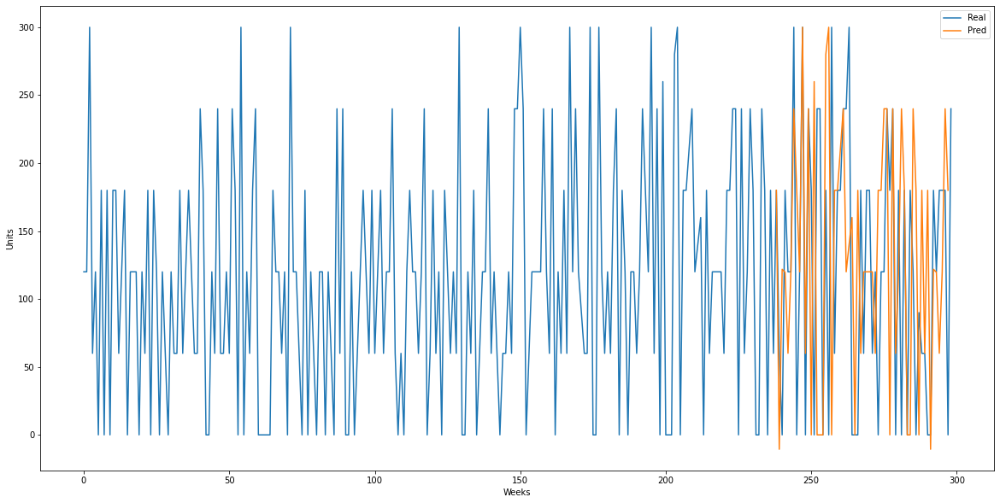

In [178]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 59)

# Putting the last real index
y_pred.loc[len(y4096_train)-1] = y4096_train[len(y4096_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

#Plotting
plt.figure(figsize = (20,10))
plt.xlabel ('Weeks')
plt.ylabel ('Units')
plt.plot(y_4096, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [179]:
print("MAPE score: ", mean_absolute_percentage_error(y4096_test, y_pred))
print("MAE score: ", mean_absolute_error(y4096_test, y_pred))

MAPE score:  1.839428441535585e+17
MAE score:  98.3630796106876


### 13.4.3. Creating a prediction for the next 8 weeks

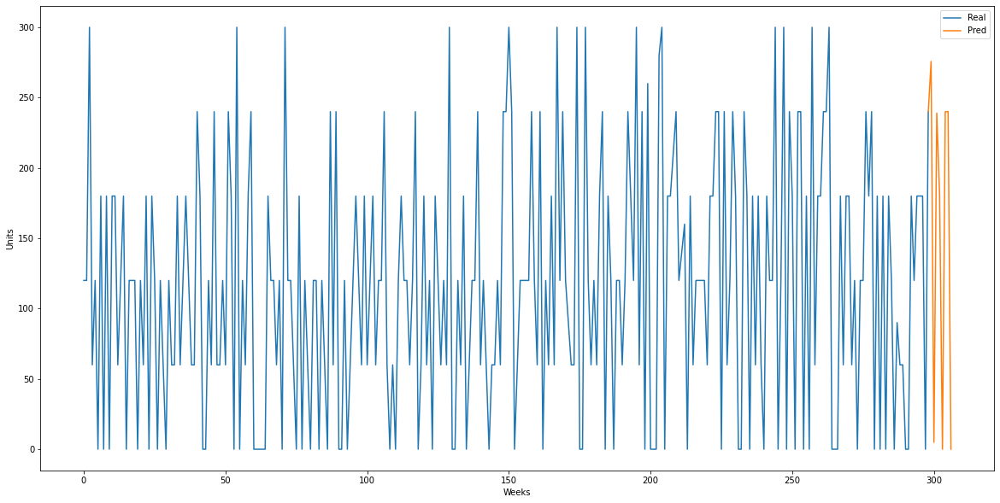

In [180]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_4096, order = (1,0,0), seasonal_order = (0,1,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_4096)-1] = y_4096[len(y_4096)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel ('Weeks')
plt.ylabel ('Units')
plt.plot(y_4096, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()

In [181]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df8 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df8)

   Date  Forecast
0   298     240.0
1   299     276.0
2   300       5.0
3   301     239.0
4   302     180.0
5   303      -0.0
6   304     240.0
7   305     240.0
8   306       0.0


In [182]:
predictions8 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120004096','120004096','120004096','120004096','120004096','120004096','120004096','120004096',],
        'Forecast': [276, 5, 239, 180, 0, 240, 240, 0]}

# Create the new DataFrame
df_forecast8 = pd.DataFrame(predictions8)

# Print the new DataFrame
print(df_forecast8)

      Date ID_Material  Forecast
0  2022-40   120004096       276
1  2022-41   120004096         5
2  2022-42   120004096       239
3  2022-43   120004096       180
4  2022-44   120004096         0
5  2022-45   120004096       240
6  2022-46   120004096       240
7  2022-47   120004096         0


# 14. Model SARIMA for Item #120014488 <a id='section-14'></a>

In [183]:
#Creating a df for ID_material #120014488 

df_14488 =df[df['ID_material']=='120014488']

In [184]:
#Ordering the dates ascending order

df_14488.sort_values("date", inplace=True, ascending=True)
df_14488.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,year-week,ID_material,Units
2349,2017-08-19,2017-33,120014488,180
2350,2017-08-26,2017-34,120014488,4860
2351,2017-09-02,2017-35,120014488,2340
2352,2017-09-09,2017-36,120014488,1620
2353,2017-09-16,2017-37,120014488,1620


In [185]:
#We do not need the columns year-week and ID_material, so we drop them.

df_14488.drop(columns=['year-week', 'ID_material'], inplace=True)

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [186]:
df_14488 = df_14488.reset_index(drop=True)

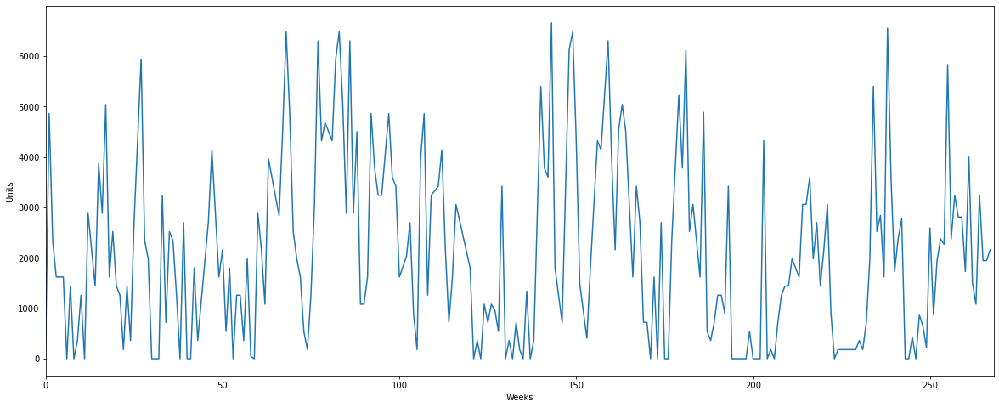

In [187]:
y_14488 = df_14488.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = len(y_14488)
plt.xlim(0, num_lags) 
plt.plot(y_14488)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [188]:
## Basic statistics

# Calculate
mean = np.mean(y_14488)
std = np.std(y_14488)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 2134.8917910447763
The standard deviation is: 1738.8524757208925


In [189]:
# Count zeros in each column
num_zeros = y_14488.eq(0).sum()
length = len(y_14488)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  268 rows
The amount of 0's in the dataset is:  35


## 14.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 14.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated. 

In [190]:
# Calculate the number of rows in the dataframe
y_14488_rows = y_14488.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_14488_rows * 0.80)

# Split the data into training and test sets
y14488_train = y_14488.iloc[:last_train_row]
y14488_test = y_14488.iloc[last_train_row:]

In [191]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y14488_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 1.305575533369765e-07
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 14.3. Autocorrelation and partial autocorrelation
Both graphs will be checked. 

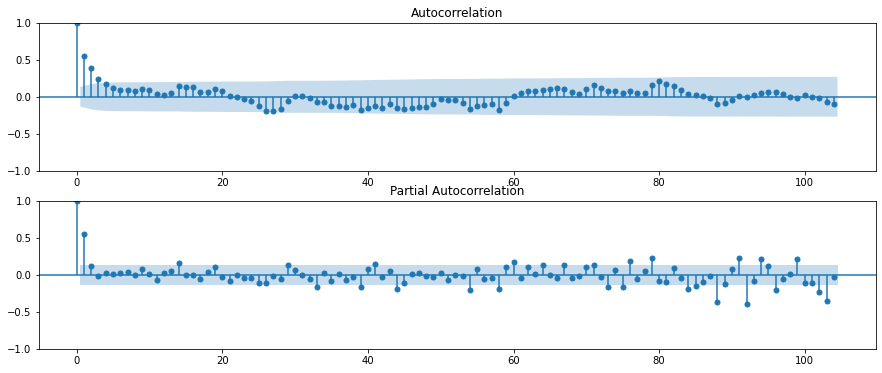

In [192]:
## Plot graphs

# Set number of lags
nlags = 104

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y14488_train, lags = nlags, ax=ax[0])
plot_pacf(y14488_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.

### 14.4 Modeling

### 14.4.1. Model: Taking differences
The differences

In [193]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y14488_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y14488_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 14.4.2. Model

                                      SARIMAX Results                                      
Dep. Variable:                               Units   No. Observations:                  214
Model:             SARIMAX(0, 0, 4)x(1, 0, [], 52)   Log Likelihood               -1891.574
Date:                             Mon, 27 Feb 2023   AIC                           3795.149
Time:                                     14:47:25   BIC                           3815.345
Sample:                                          0   HQIC                          3803.310
                                             - 214                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.6419      0.069      9.353      0.000       0.507       0.776
ma.L2          0.5534      

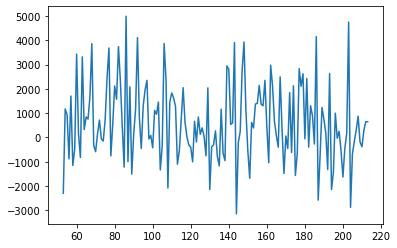

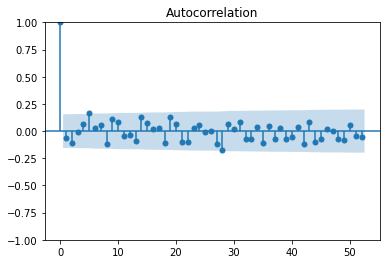

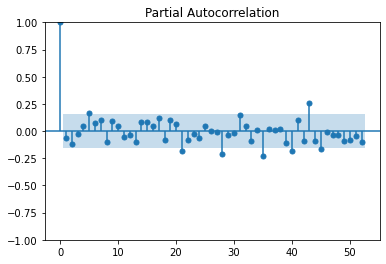

In [194]:
fit = SARIMAX(endog = y14488_train, order = (0,0,4), seasonal_order = (1,0,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=52

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9831033945083618 p-value 0.04682117700576782


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



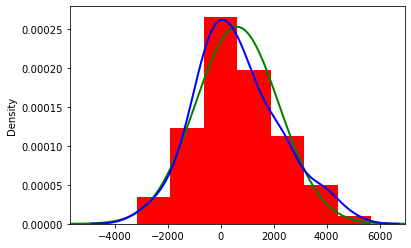

In [195]:
# Normality and residuals test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

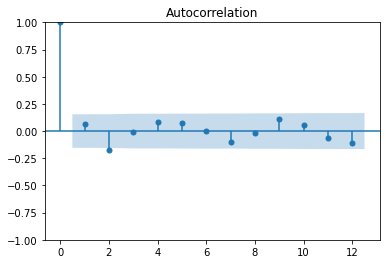

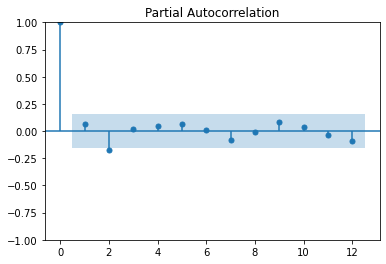

In [196]:
## ACF and PACF for square residuals
plot_acf(residuos**2,lags=12)
plt.show()
plot_pacf(residuos**2,lags=12,method="ols")
plt.show()

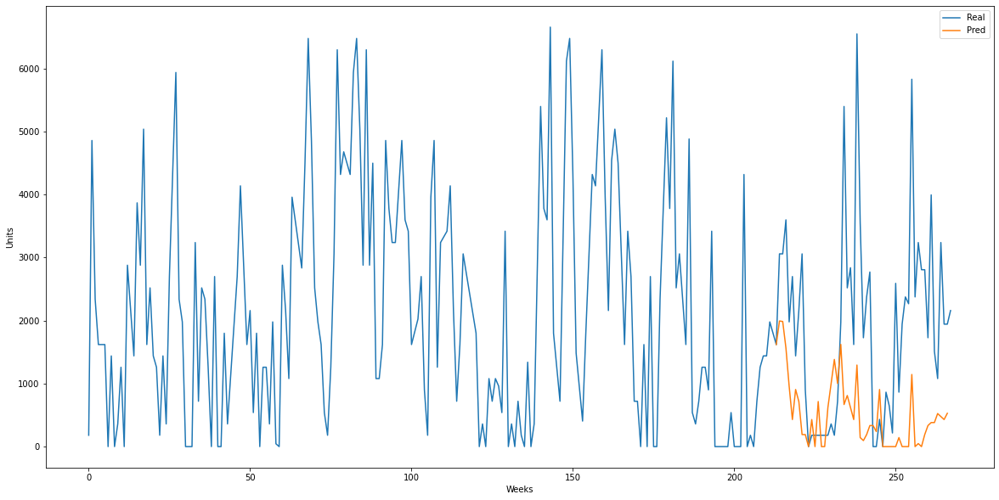

In [197]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 53)

# Putting the last real index
y_pred.loc[len(y14488_train)-1] = y14488_train[len(y14488_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

# Plotting
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_14488, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [198]:
print("MAPE score: ", mean_absolute_percentage_error(y14488_test, y_pred))
print("MAE score: ", mean_absolute_error(y14488_test, y_pred))

MAPE score:  1.4723868370383264e+17
MAE score:  1539.5321318041654


### 14.4.3. Creating a prediction for the next 8 weeks

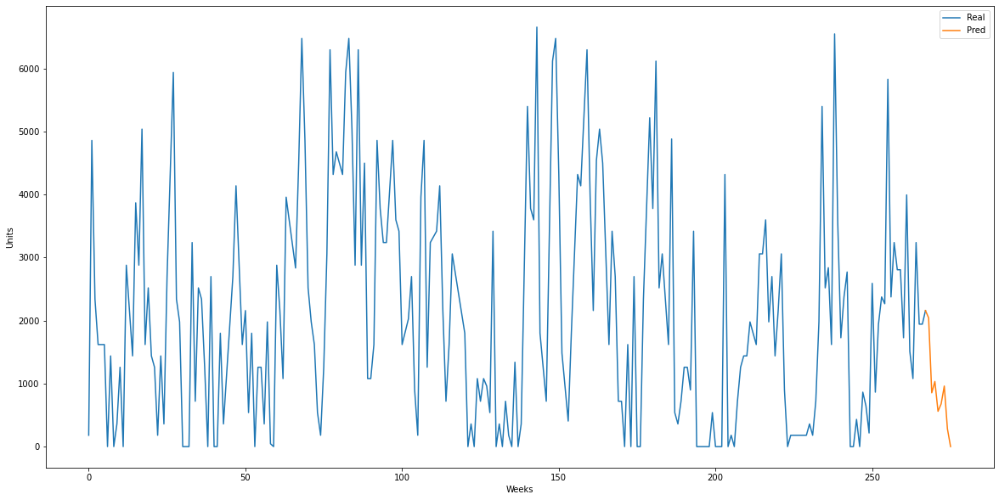

In [199]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_14488, order = (0,0,4), seasonal_order = (1,0,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_14488)-1] = y_14488[len(y_14488)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_14488, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()

In [200]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df9 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df9)

   Date  Forecast
0   267    2160.0
1   268    2044.0
2   269     853.0
3   270    1034.0
4   271     560.0
5   272     679.0
6   273     961.0
7   274     283.0
8   275       0.0


In [201]:
predictions9 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120014488','120014488','120014488','120014488','120014488','120014488','120014488','120014488',],
        'Forecast': [2044, 853, 1034, 560, 679, 961, 283, 0]}

# Create the new DataFrame
df_forecast9 = pd.DataFrame(predictions9)

# Print the new DataFrame
print(df_forecast9)

      Date ID_Material  Forecast
0  2022-40   120014488      2044
1  2022-41   120014488       853
2  2022-42   120014488      1034
3  2022-43   120014488       560
4  2022-44   120014488       679
5  2022-45   120014488       961
6  2022-46   120014488       283
7  2022-47   120014488         0


# 15. Model SARIMA for Item #120014486 <a id='section-15'></a>

In [202]:
#Creating a df for ID_material #120014486 

df_14486 =df[df['ID_material']=='120014486']

In [203]:
#Ordering the dates ascending order

df_14486.sort_values("date", inplace=True, ascending=True)

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [204]:
#We do not need the columns year-week and ID_material, so we drop them.

df_14486.drop(columns=['year-week', 'ID_material'], inplace=True)
df_14486.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,Units
2088,2017-10-07,3024
2089,2017-10-14,378
2090,2017-10-21,912
2091,2017-10-28,2646
2092,2017-11-04,756


In [205]:
df_14486 = df_14486.reset_index(drop=True)

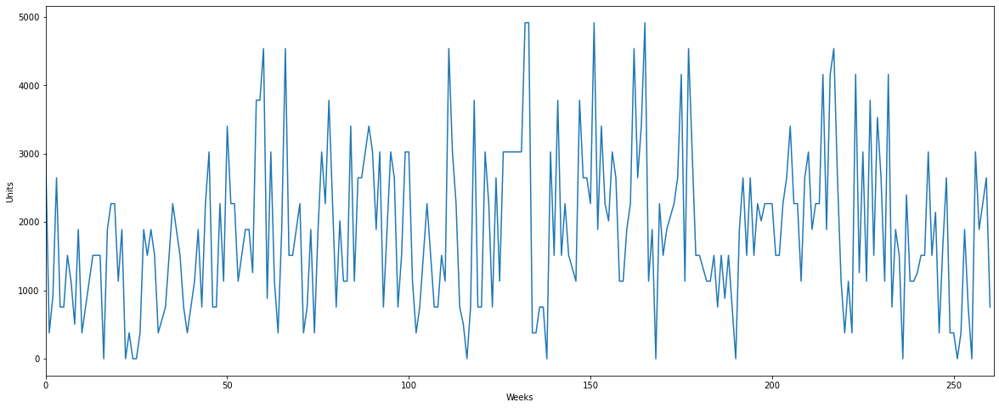

In [206]:
y_14486 = df_14486.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = len(y_14486)
plt.xlim(0, num_lags) 
plt.plot(y_14486)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [207]:
## Basic statistics

# Calculate
mean = np.mean(y_14486)
std = np.std(y_14486)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 1868.8735632183907
The standard deviation is: 1140.7628502740897


In [208]:
# Count zeros in each column
num_zeros = y_14486.eq(0).sum()
length = len(y_14486)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  261 rows
The amount of 0's in the dataset is:  11


## 15.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 15.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated. 

In [209]:
# Calculate the number of rows in the dataframe
y_14486_rows = y_14486.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_14486_rows * 0.80)

# Split the data into training and test sets
y14486_train = y_14486.iloc[:last_train_row]
y14486_test = y_14486.iloc[last_train_row:]

In [210]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y14486_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 1.9463882573896776e-11
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 15.3. Autocorrelation and partial autocorrelation
Both graphs will be checked. 

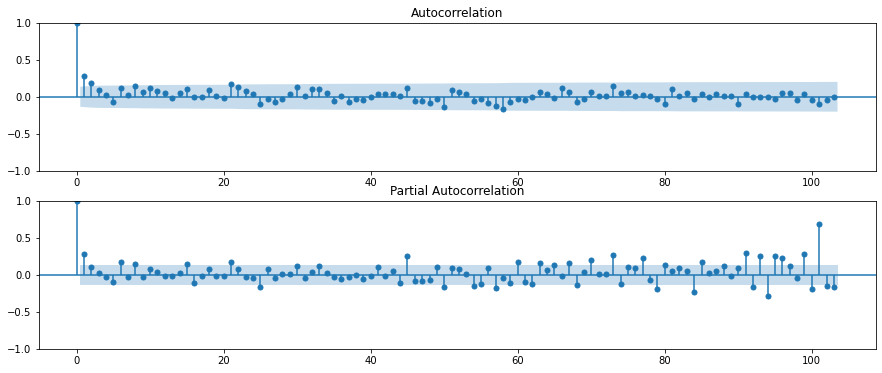

In [211]:
## Plot graphs

# Set number of lags
nlags = 103

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y14486_train, lags = nlags, ax=ax[0])
plot_pacf(y14486_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.



### 15.4 Modeling

### 15.4.1. Model: Taking differences
The differences 

In [212]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y14486_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y14486_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 15.4.2. Model

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                                      SARIMAX Results                                       
Dep. Variable:                                Units   No. Observations:                  208
Model:             SARIMAX(0, 0, 4)x(0, 1, [1], 52)   Log Likelihood               -1340.615
Date:                              Mon, 27 Feb 2023   AIC                           2693.231
Time:                                      14:47:44   BIC                           2711.530
Sample:                                           0   HQIC                          2700.663
                                              - 208                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2874      0.089      3.223      0.001       0.113       0.462
ma.L2          0.32

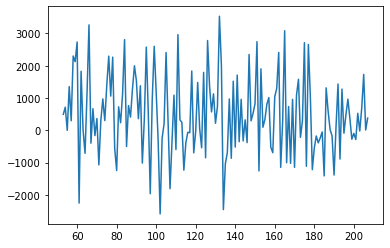

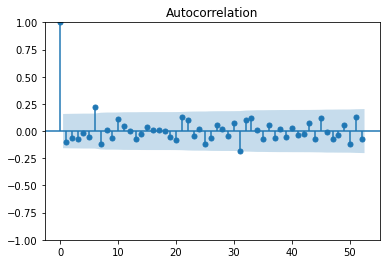

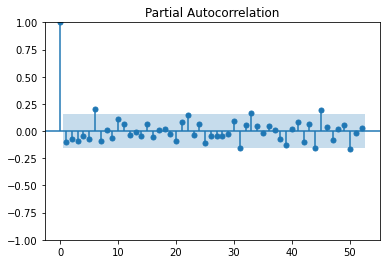

In [213]:
fit = SARIMAX(endog = y14486_train, order = (0,0,4), seasonal_order = (0,1,1,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=52

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9897233843803406 p-value 0.31923454999923706


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



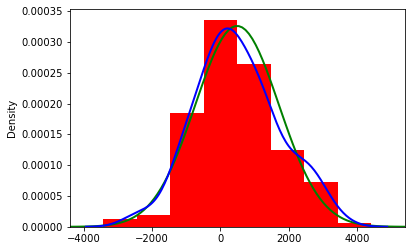

In [214]:
# Normality and residuals test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

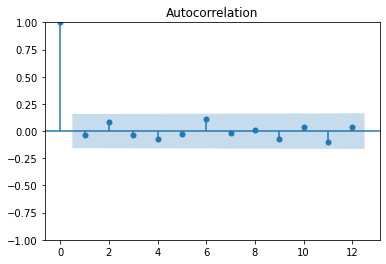

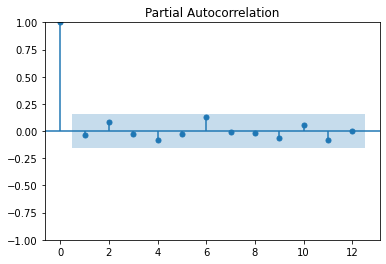

In [215]:
## ACF and PACF for square residuals
plot_acf(residuos**2,lags=12)
plt.show()
plot_pacf(residuos**2,lags=12,method="ols")
plt.show()

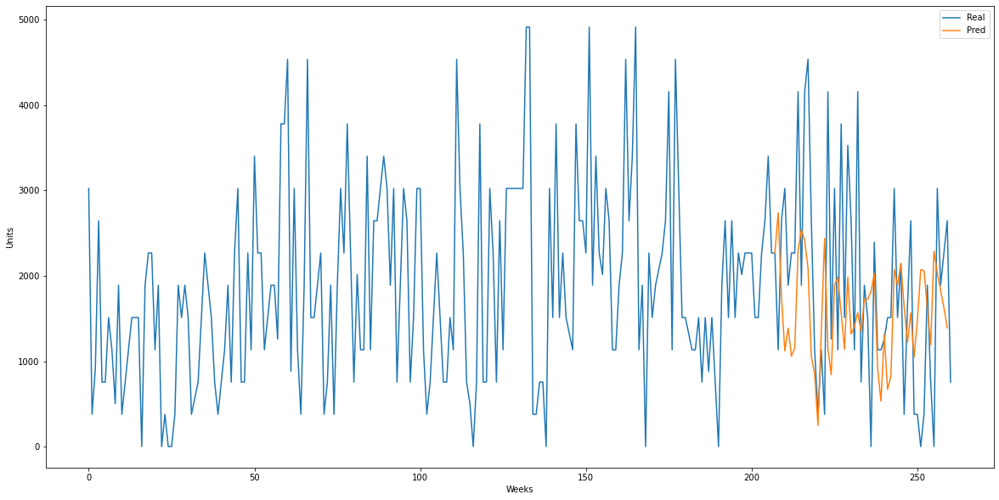

In [216]:
## Testing model

# Pintamos las siguientes predicciones
y_pred = fit.forecast(steps = 52)

# Ponemos el último índice real
y_pred.loc[len(y14486_train)-1] = y14486_train[len(y14486_train)-1]

# Reseteamos los índices, ordenamos por índice y volvemos a poner el índice como índice de la Serie.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

# Plot
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_14486, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [217]:
print("MAPE score : ", mean_absolute_percentage_error(y14486_test, y_pred))
print("MAE score: ", mean_absolute_error(y14486_test, y_pred))

MAPE score :  3.74230492806414e+17
MAE score:  967.8102165703625


### 15.4.3. Creating a prediction for the next 8 weeks

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning:

Non-invertible starting seasonal moving average Using zeros as starting parameters.



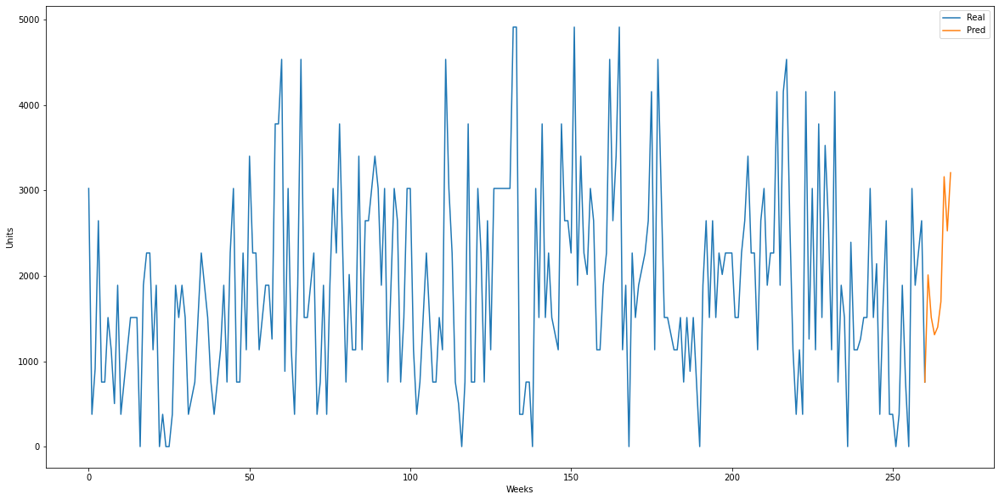

In [218]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_14486, order = (0,0,4), seasonal_order = (0,1,1,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_14486)-1] = y_14486[len(y_14486)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_14486, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()

In [219]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df10 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df10)

   Date  Forecast
0   260     756.0
1   261    2011.0
2   262    1513.0
3   263    1310.0
4   264    1399.0
5   265    1697.0
6   266    3161.0
7   267    2527.0
8   268    3208.0


In [220]:
predictions10 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120014486','120014486','120014486','120014486','120014486','120014486','120014486','120014486',],
        'Forecast': [2011, 1513, 1310, 1399, 1697, 3161, 2527, 3208]}

# Create the new DataFrame
df_forecast10 = pd.DataFrame(predictions10)

# Print the new DataFrame
print(df_forecast10)

      Date ID_Material  Forecast
0  2022-40   120014486      2011
1  2022-41   120014486      1513
2  2022-42   120014486      1310
3  2022-43   120014486      1399
4  2022-44   120014486      1697
5  2022-45   120014486      3161
6  2022-46   120014486      2527
7  2022-47   120014486      3208


# 16. Model SARIMA for Item #120009816 <a id='section-16'></a>

In [221]:
#Creating a df for ID_material #120009816 

df_9816 =df[df['ID_material']=='120009816']

In [222]:
#Ordering the dates ascending order

#We do not need the columns year-week and ID_material, so we drop them.df_9816.sort_values("date", inplace=True, ascending=True)

In [223]:
#We do not need the columns year-week and ID_material, so we drop them.

df_9816.drop(columns=['year-week', 'ID_material'], inplace=True)
df_9816.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,Units
1680,2018-02-10,720
1681,2018-02-17,432
1682,2018-02-24,432
1683,2018-03-03,576
1684,2018-03-10,288


In [224]:
df_9816 = df_9816.reset_index(drop=True)

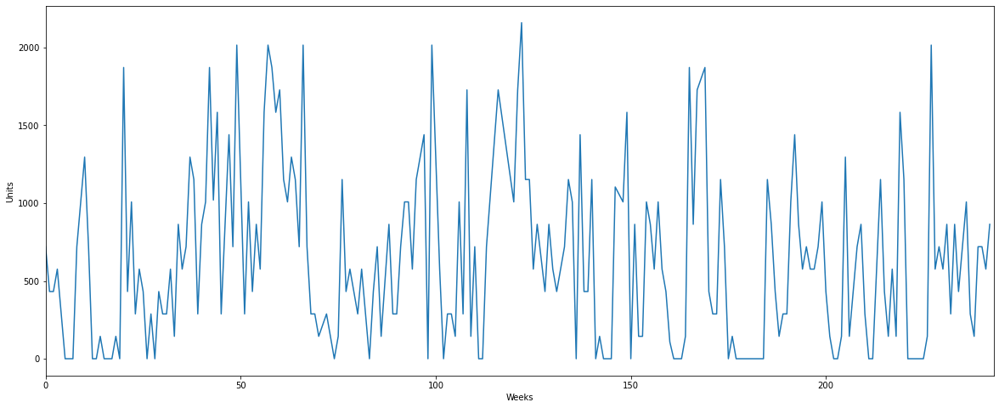

In [225]:
y_9816 = df_9816.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = len(y_9816)
plt.xlim(0, num_lags) 
plt.plot(y_9816)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [226]:
## Basic statistics

# Calculate
mean = np.mean(y_9816)
std = np.std(y_9816)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 645.5308641975308
The standard deviation is: 551.4058594963491


In [227]:
# Count zeros in each column
num_zeros = y_9816.eq(0).sum()
length = len(y_9816)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  243 rows
The amount of 0's in the dataset is:  44


## 16.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 16.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [228]:
# Calculate the number of rows in the dataframe
y_9816_rows = y_9816.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_9816_rows * 0.80)

# Split the data into training and test sets
y9816_train = y_9816.iloc[:last_train_row]
y9816_test = y_9816.iloc[last_train_row:]

In [229]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y9816_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 6.518418150831044e-07
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 16.3. Autocorrelation and partial autocorrelation
Both graphs will be checked.

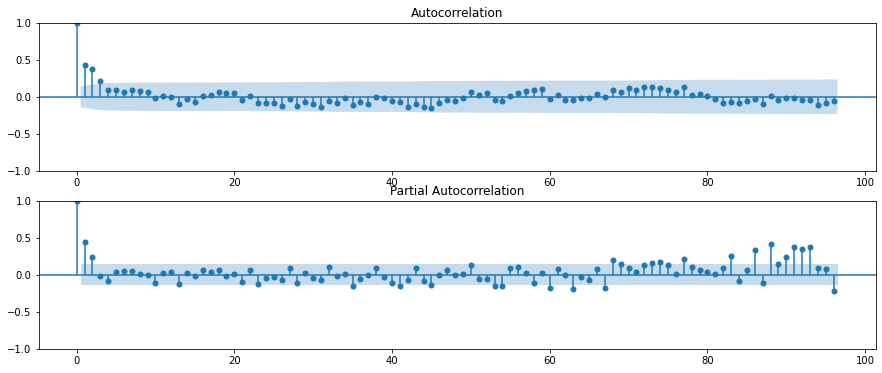

In [230]:
## Plot graphs

# Set number of lags
nlags = 96

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y9816_train, lags = nlags, ax=ax[0])
plot_pacf(y9816_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.

### 16.4 Modeling

### 16.4.1. Model: Taking differences
The differences

In [231]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y9816_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y9816_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 16.4.2. Model 

                                      SARIMAX Results                                      
Dep. Variable:                               Units   No. Observations:                  194
Model:             SARIMAX(2, 0, 1)x(2, 1, [], 52)   Log Likelihood               -1111.030
Date:                             Mon, 27 Feb 2023   AIC                           2234.059
Time:                                     14:48:25   BIC                           2251.794
Sample:                                          0   HQIC                          2241.266
                                             - 194                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3306      0.133     10.032      0.000       1.071       1.591
ar.L2         -0.3473      

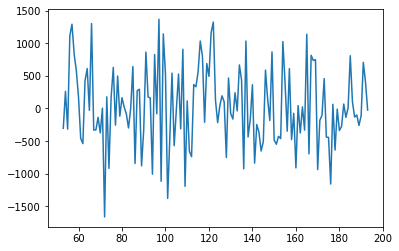

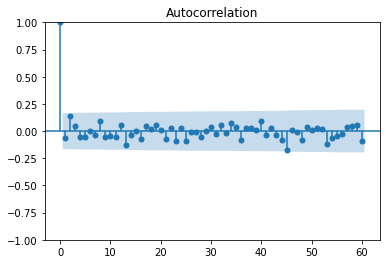

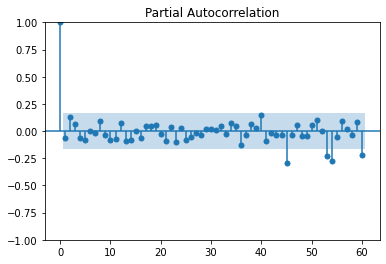

In [232]:
fit = SARIMAX(endog = y9816_train, order = (2,0,1), seasonal_order = (2,1,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=60

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9917156100273132 p-value 0.5802837014198303


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



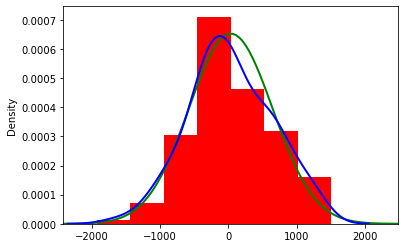

In [233]:
# Normality and residual test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

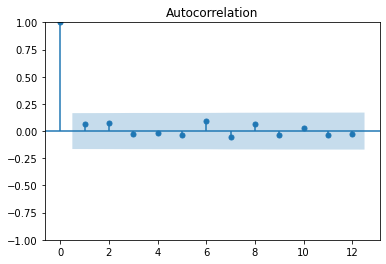

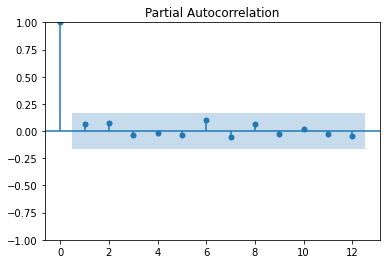

In [234]:
## ACF and PACF for square residuals

plot_acf(residuos**2,lags=12)
plt.show()
plot_pacf(residuos**2,lags=12,method="ols")
plt.show()

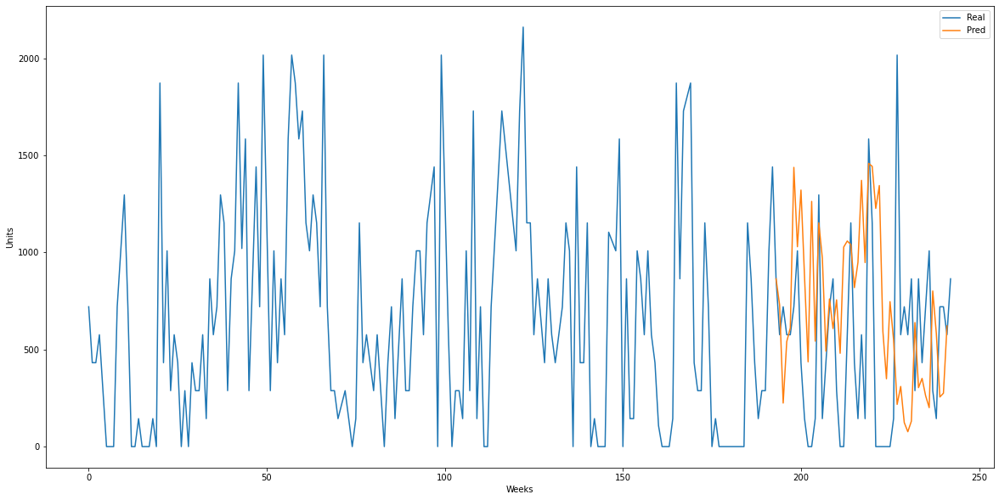

In [235]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 48)

# Putting the last real index
y_pred.loc[len(y9816_train)-1] = y9816_train[len(y9816_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

# Plotting
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_9816, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [236]:
print("MAPE score: ", mean_absolute_percentage_error(y9816_test, y_pred))
print("MAE score: ", mean_absolute_error(y9816_test, y_pred))

MAPE score:  6.89511058486339e+17
MAE score:  541.468576825873


### 16.4.3. Creating a prediction for the next 8 weeks

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



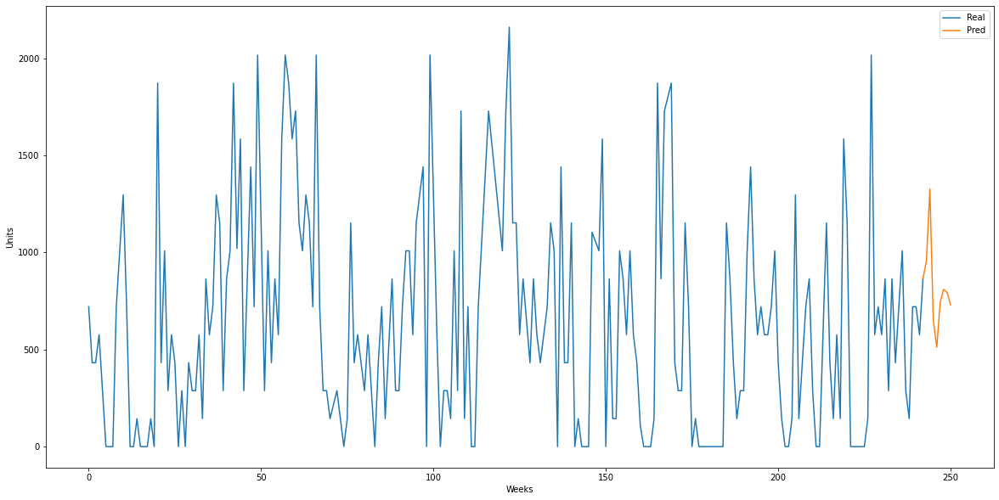

In [237]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_9816, order = (2,0,1), seasonal_order = (2,1,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_9816)-1] = y_9816[len(y_9816)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_9816, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()

In [238]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df11 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df11)

   Date  Forecast
0   242     864.0
1   243     957.0
2   244    1327.0
3   245     648.0
4   246     511.0
5   247     744.0
6   248     810.0
7   249     793.0
8   250     730.0


In [239]:
predictions11 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120009816','120009816','120009816','120009816','120009816','120009816','120009816','120009816',],
        'Forecast': [973, 1320, 654, 520, 762, 832, 816, 732]}

# Create the new DataFrame
df_forecast11 = pd.DataFrame(predictions11)

# Print the new DataFrame
print(df_forecast11)

      Date ID_Material  Forecast
0  2022-40   120009816       973
1  2022-41   120009816      1320
2  2022-42   120009816       654
3  2022-43   120009816       520
4  2022-44   120009816       762
5  2022-45   120009816       832
6  2022-46   120009816       816
7  2022-47   120009816       732


# 17. Model SARIMA for Item #120015996 <a id='section-17'></a>

In [240]:
#Creating a df for ID_material #120015996 

df_5996 =df[df['ID_material']=='120015996']

In [241]:
#Ordering the dates ascending order

df_5996.sort_values("date", inplace=True, ascending=True)

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [242]:
#We do not need the columns year-week and ID_material, so we drop them.

df_5996.drop(columns=['year-week', 'ID_material'], inplace=True)
df_5996.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,Units
2617,2018-03-03,482
2618,2018-03-10,536
2619,2018-03-17,0
2620,2018-03-24,0
2621,2018-03-31,32


In [243]:
df_5996 = df_5996.reset_index(drop=True)

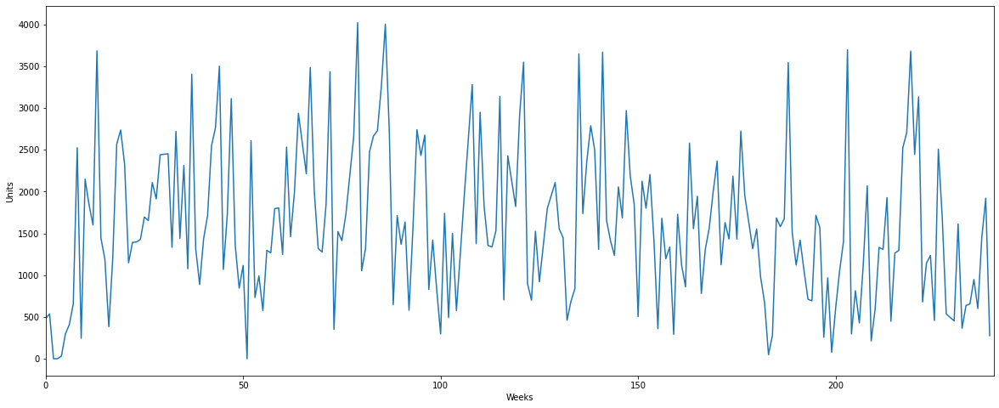

In [244]:
y_5996 = df_5996.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = len(y_5996)
plt.xlim(0, num_lags) 
plt.plot(y_5996)

# Actually plot data
plt.xlabel ('Weeks')
plt.ylabel ('Units')
plt.show()

In [245]:
## Basic statistics

# Calculate
mean = np.mean(y_5996)
std = np.std(y_5996)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 1605.5958333333333
The standard deviation is: 898.5418275272286


In [246]:
# Count zeros in each column
num_zeros = y_5996.eq(0).sum()
length = len(y_5996)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  240 rows
The amount of 0's in the dataset is:  3


## 17.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 17.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [247]:
# Calculate the number of rows in the dataframe
y_5996_rows = y_5996.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_5996_rows * 0.80)

# Split the data into training and test sets
y5996_train = y_5996.iloc[:last_train_row]
y5996_test = y_5996.iloc[last_train_row:]

In [248]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y5996_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 2.7883275449428994e-19
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 17.3. Autocorrelation and partial autocorrelation
Both graphs will be checked. 

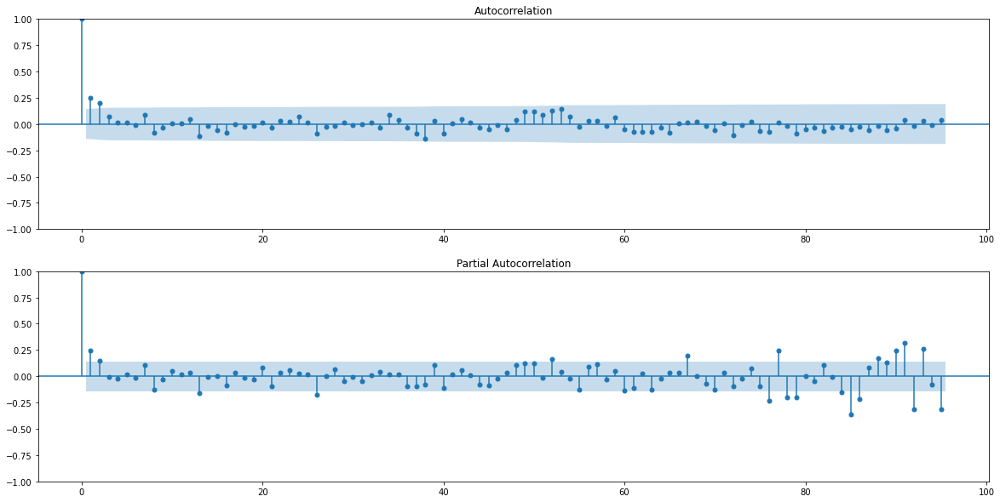

In [249]:
## Plot graphs

# Set number of lags
nlags = 95

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (20,10))

# Actually produce plots
plot_acf(y5996_train, lags = nlags, ax=ax[0])
plot_pacf(y5996_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.



### 17.4 Modeling

### 17.4.1. Model: Taking differences
The differences

In [250]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y5996_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y5996_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 17.4.2. Model 

C:\Users\amish\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.



                                     SARIMAX Results                                      
Dep. Variable:                              Units   No. Observations:                  192
Model:             SARIMAX(1, 0, 0)x(3, 1, 0, 52)   Log Likelihood               -1165.371
Date:                            Mon, 27 Feb 2023   AIC                           2340.742
Time:                                    14:49:47   BIC                           2355.450
Sample:                                         0   HQIC                          2346.719
                                            - 192                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2277      0.089      2.572      0.010       0.054       0.401
ar.S.L52      -0.6964      0.138   

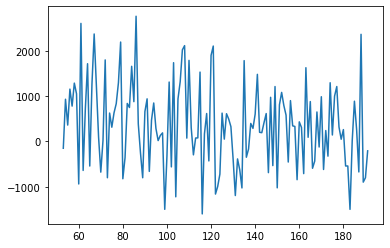

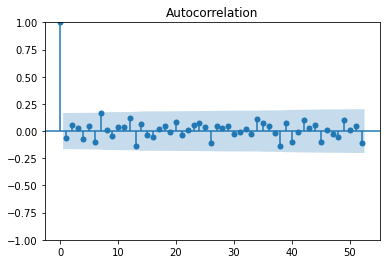

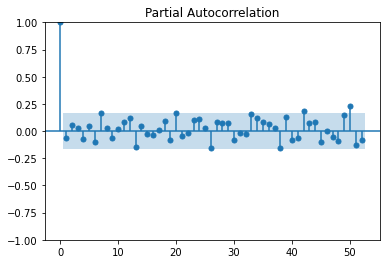

In [251]:
fit = SARIMAX(endog = y5996_train, order = (1,0,0), seasonal_order = (3,1,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=52

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9872571229934692 p-value 0.22895148396492004


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



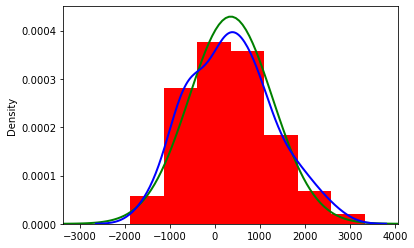

In [252]:
# Normality and residual test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

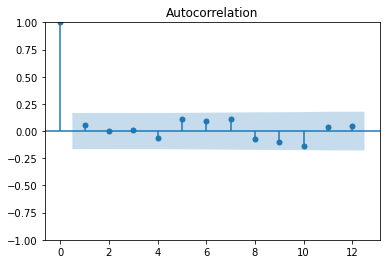

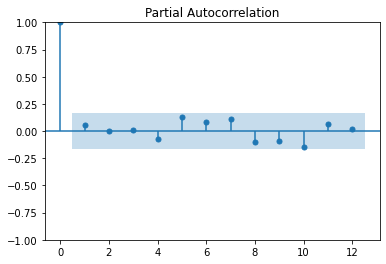

In [253]:
## ACF and PACF for square residuals
plot_acf(residuos**2,lags=12)
plt.show()
plot_pacf(residuos**2,lags=12,method="ols")
plt.show()

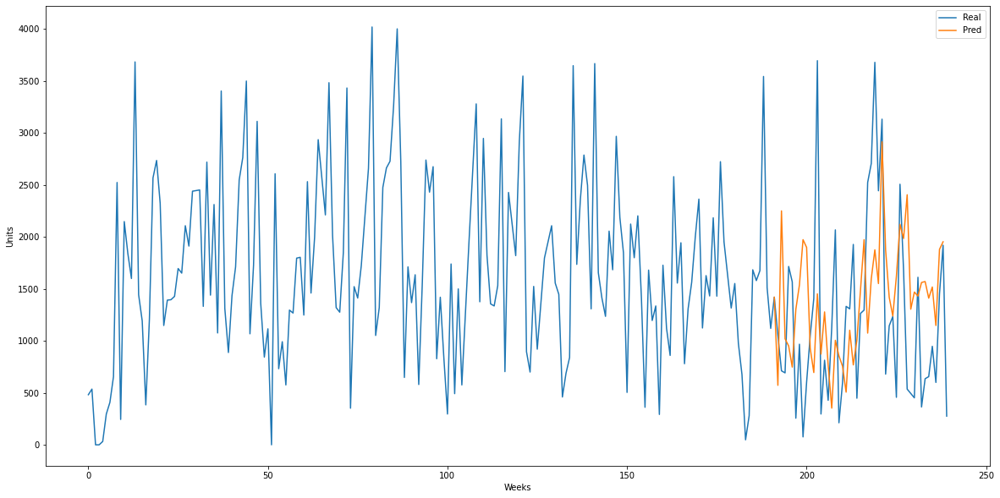

In [254]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 47)

# Putting the last real index
y_pred.loc[len(y5996_train)-1] = y5996_train[len(y5996_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

# Plotting
plt.figure(figsize = (20,10))
plt.xlabel ('Weeks')
plt.ylabel ('Units')
plt.plot(y_5996, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [255]:
print("MAPE score: ", mean_absolute_percentage_error(y5996_test, y_pred))
print("MAE score: ", mean_absolute_error(y5996_test, y_pred))

MAPE score:  1.5491198480729544
MAE score:  872.5115600221828


### 17.4.3. Creating a prediction for the next 8 weeks 

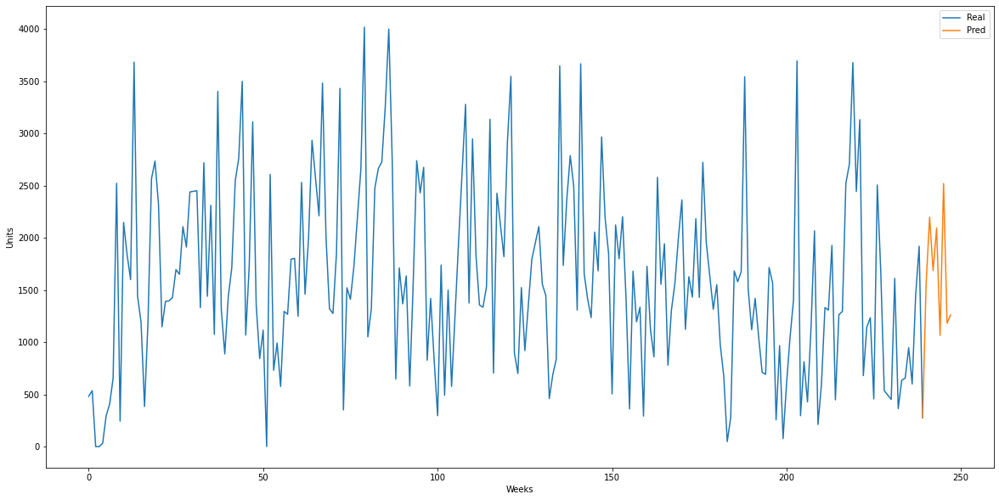

In [256]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_5996, order = (1,0,0), seasonal_order = (3,1,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_5996)-1] = y_5996[len(y_5996)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel ('Weeks')
plt.ylabel ('Units')
plt.plot(y_5996, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()


In [257]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df12 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df12)

   Date  Forecast
0   239     276.0
1   240    1565.0
2   241    2198.0
3   242    1687.0
4   243    2095.0
5   244    1066.0
6   245    2521.0
7   246    1182.0
8   247    1262.0


In [258]:
predictions12 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120015996','120015996','120015996','120015996','120015996','120015996','120015996','120015996',],
        'Forecast': [1561, 2182, 1690, 2088, 1054, 2469, 1172, 1270]}

# Create the new DataFrame
df_forecast12 = pd.DataFrame(predictions12)

# Print the new DataFrame
print(df_forecast12)

      Date ID_Material  Forecast
0  2022-40   120015996      1561
1  2022-41   120015996      2182
2  2022-42   120015996      1690
3  2022-43   120015996      2088
4  2022-44   120015996      1054
5  2022-45   120015996      2469
6  2022-46   120015996      1172
7  2022-47   120015996      1270


# 18. Model SARIMA for Item #120012606  <a id='section-18'></a>

In [259]:
#Creating a df for ID_material #120012606 

df_12606 =df[df['ID_material']=='120012606']

In [260]:
#Ordering the dates ascending order

df_12606.sort_values("date", inplace=True, ascending=True)

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [261]:
#We do not need the columns year-week and ID_material, so we drop them.

df_12606.drop(columns=['year-week', 'ID_material'], inplace=True)
df_12606.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,Units
186,2020-07-04,910
187,2020-07-11,280
188,2020-07-18,70
189,2020-07-25,490
190,2020-08-01,1540


In [262]:
df_12606 = df_12606.reset_index(drop=True)

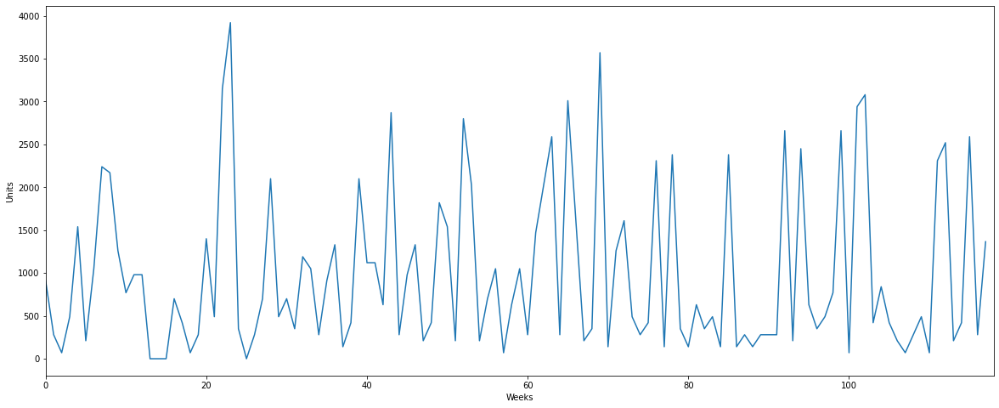

In [263]:
y_12606 = df_12606.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = len(y_12606)
plt.xlim(0, num_lags) 
plt.plot(y_12606)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [264]:
## Basic statistics

# Calculate
mean = np.mean(y_12606)
std = np.std(y_12606)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 982.6694915254237
The standard deviation is: 945.9130828229804


In [265]:
# Count zeros in each column
num_zeros = y_12606.eq(0).sum()
length = len(y_12606)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  118 rows
The amount of 0's in the dataset is:  4


## 18.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 18.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [266]:
# Calculate the number of rows in the dataframe
y_12606_rows = y_12606.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_12606_rows * 0.80)

# Split the data into training and test sets
y12606_train = y_12606.iloc[:last_train_row]
y12606_test = y_12606.iloc[last_train_row:]

In [267]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y12606_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 0.0005811579736871342
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.

### 18.3. Autocorrelation and partial autocorrelation
Both graphs will be checked.

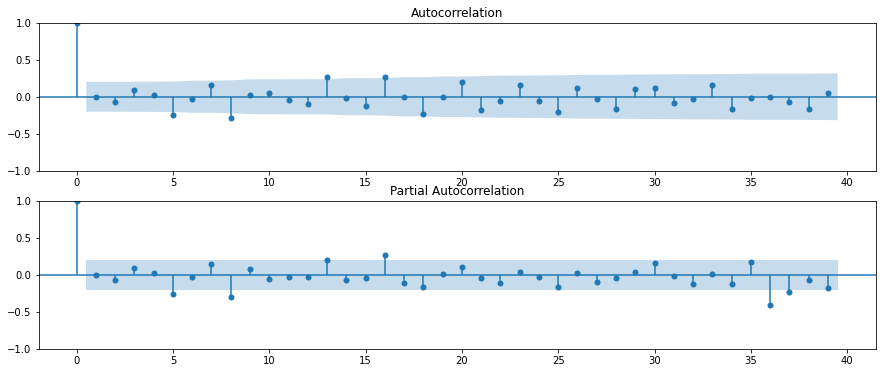

In [268]:
## Plot graphs

# Set number of lags
nlags = 39

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y12606_train, lags = nlags, ax=ax[0])
plot_pacf(y12606_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.

### 18.4 Modeling

### 18.4.1. Model: Taking differences
The differences

In [269]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y12606_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y12606_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  0
Number of seasonal differences to take:  0


### 18.4.2. Model 

                               SARIMAX Results                                
Dep. Variable:                  Units   No. Observations:                   94
Model:               SARIMAX(3, 0, 0)   Log Likelihood                -784.175
Date:                Mon, 27 Feb 2023   AIC                           1576.350
Time:                        14:50:25   BIC                           1586.523
Sample:                             0   HQIC                          1580.459
                                 - 94                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2634      0.093      2.840      0.005       0.082       0.445
ar.L2          0.1571      0.106      1.481      0.139      -0.051       0.365
ar.L3          0.3532      0.112      3.160      0.0

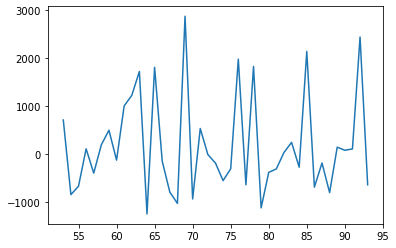

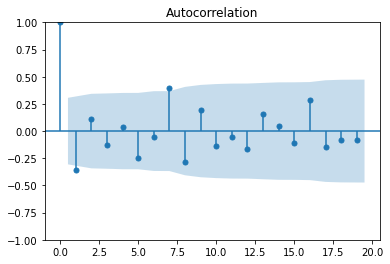

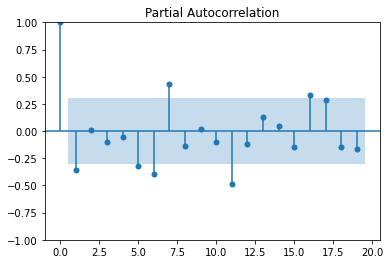

In [270]:
fit = SARIMAX(endog = y12606_train, order = (3,0,0), seasonal_order = (0,0,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=19

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.898209273815155 p-value 0.001468753907829523


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



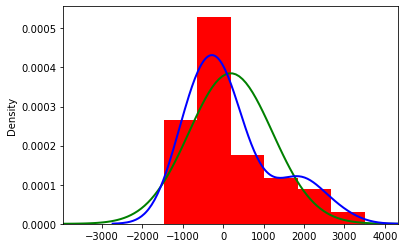

In [271]:
# Normality and residuals test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

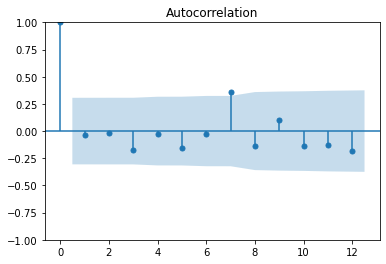

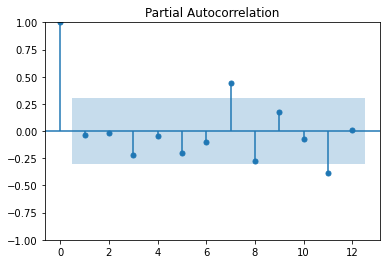

In [272]:
## ACF and PACF for square residuals
plot_acf(residuos**2,lags=12)
plt.show()
plot_pacf(residuos**2,lags=12,method="ols")
plt.show()

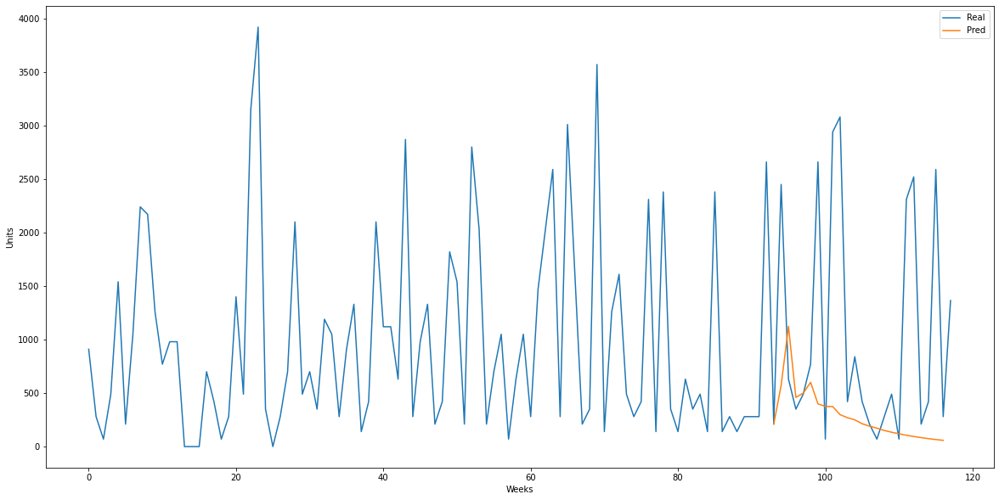

In [273]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 23)

# Putting the last real index
y_pred.loc[len(y12606_train)-1] = y12606_train[len(y12606_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

# Plotting
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_12606, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [274]:
print("MAPE score: ", mean_absolute_percentage_error(y12606_test, y_pred))
print("MAE score: ", mean_absolute_error(y12606_test, y_pred))

MAPE score:  0.9133023650154829
MAE score:  900.8194386525884


### 18.4.3. Creating a prediction for the next 8 weeks 

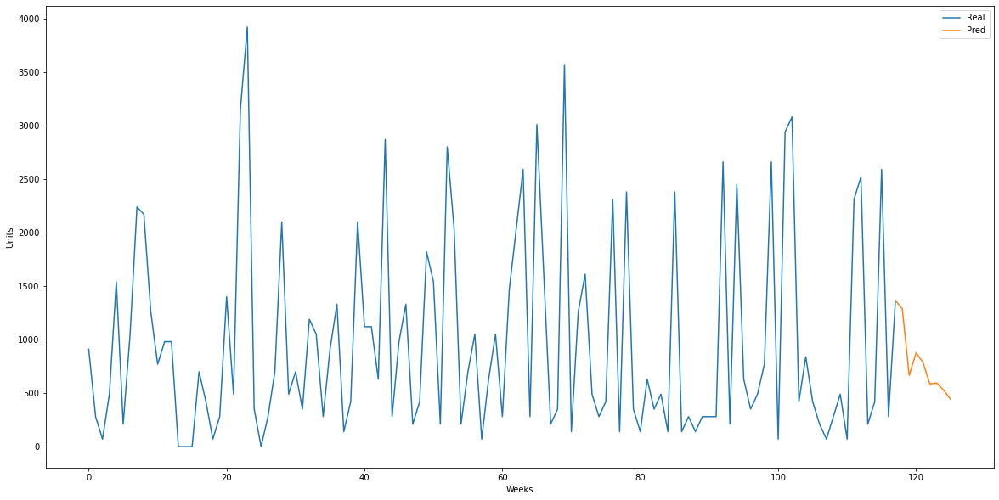

In [275]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_12606, order = (3,0,0), seasonal_order = (0,0,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_12606)-1] = y_12606[len(y_12606)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_12606, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()


In [276]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df13 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df13)

   Date  Forecast
0   117    1365.0
1   118    1287.0
2   119     665.0
3   120     877.0
4   121     786.0
5   122     586.0
6   123     594.0
7   124     527.0
8   125     443.0


In [277]:
predictions13 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120012606','120012606','120012606','120012606','120012606','120012606','120012606','120012606',],
        'Forecast': [1287, 665, 877, 786, 586, 594, 527, 443]}

# Create the new DataFrame
df_forecast13 = pd.DataFrame(predictions13)

# Print the new DataFrame
print(df_forecast13)

      Date ID_Material  Forecast
0  2022-40   120012606      1287
1  2022-41   120012606       665
2  2022-42   120012606       877
3  2022-43   120012606       786
4  2022-44   120012606       586
5  2022-45   120012606       594
6  2022-46   120012606       527
7  2022-47   120012606       443


# 19. Model SARIMA for Item #120015842  <a id='section-19'></a>

In [278]:
#Creating a df for ID_material #120015842

df_15842 =df[df['ID_material']=='120015842']

In [279]:
#Ordering the dates ascending order

df_15842.sort_values("date", inplace=True, ascending=True)

C:\Users\amish\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [280]:
#We do not need the columns year-week and ID_material, so we drop them.

df_15842.drop(columns=['year-week', 'ID_material'], inplace=True)
df_15842.head()

C:\Users\amish\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,Units
1143,2020-11-07,600
1144,2020-11-14,760
1145,2020-11-21,920
1146,2020-11-28,200
1147,2020-12-05,320


In [281]:
df_15842 = df_15842.reset_index(drop=True)

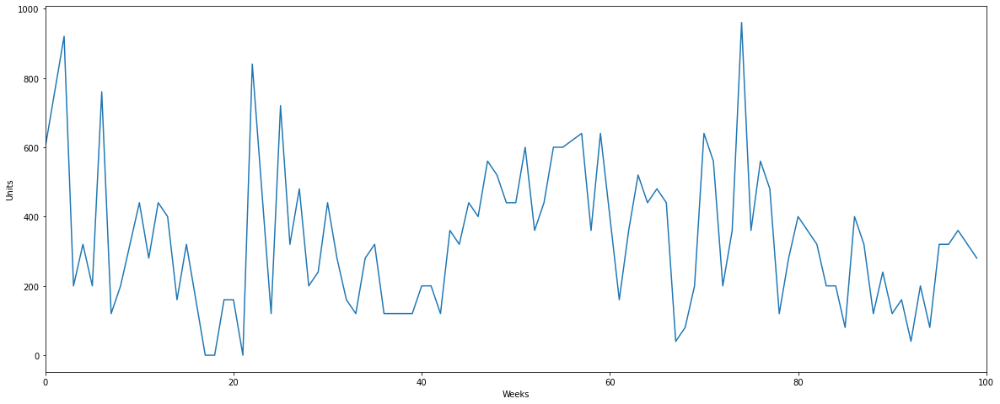

In [282]:
y_15842 = df_15842.iloc[:,1]

## Plot data
plt.figure(figsize=(20, 8))
num_lags = 100
plt.xlim(0, num_lags) 
plt.plot(y_15842)

# Actually plot data
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.show()

In [283]:
## Basic statistics

# Calculate
mean = np.mean(y_15842)
std = np.std(y_15842)

# Print
print("The mean is: " + str(mean))
print("The standard deviation is: " + str(std))

The mean is: 337.4
The standard deviation is: 205.73098940120778


In [284]:
# Count zeros in each column
num_zeros = y_15842.eq(0).sum()
length = len(y_15842)

print("The total dataset has: ", length, "rows")
print("The amount of 0's in the dataset is: ", num_zeros)

The total dataset has:  100 rows
The amount of 0's in the dataset is:  3


## 19.1 Premodeling
In this stage, the stationary part will be checked, as this is a condition to be able to model the dataset.

### 19.2. Stationarity
First the formal test will be performed, and then the necesary number of differences will be calculated.

In [285]:
# Calculate the number of rows in the dataframe
y_15842_rows = y_15842.shape[0]

# Calculate the index of the last row in the training set
last_train_row = int(y_15842_rows * 0.80)

# Split the data into training and test sets
y15842_train = y_15842.iloc[:last_train_row]
y15842_test = y_15842.iloc[last_train_row:]

In [286]:
# ADF test
adf_test = sm.tsa.stattools.adfuller(y15842_train,maxlag=10) 

# Print result
print("The p-value for ADF is: " + str(adf_test[1]))

if adf_test[1] < 0.05:
    print("The series is stationary")
    stationary = 1
else:
    print("The series is not stationary because of the ADF test")
    stationary = 0

The p-value for ADF is: 0.0007475271814402729
The series is stationary


p-value of the ADF indicates it is less than 0.05 meaning that the data is stationary. However if we look at the plot it is clear that the mean is not 0, which contradicts the ADF test. For this reason we need to transform the data before continuing with the process.



### 19.3. Autocorrelation and partial autocorrelation
Both graphs will be checked.

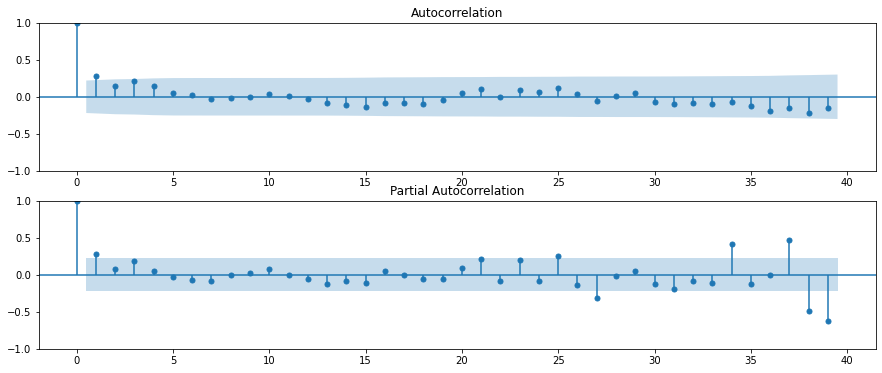

In [287]:
## Plot graphs

# Set number of lags
nlags = 39

# Set axis to plot
fig, ax = plt.subplots(2,1, figsize = (15,6))

# Actually produce plots
plot_acf(y15842_train, lags = nlags, ax=ax[0])
plot_pacf(y15842_train, lags = nlags, method="ols", ax=ax[1])
plt.show()

As it can be seen, the series is not white noise, as it is out of bounds. Meaning that the model can be fitted to the data.

### 19.4 Modeling

### 19.4.1. Model: Taking differences
The differences

In [288]:
## Tests for differences

# Set s to 52 (because we have weekly data)
s = 52

# Calculate differences
d = ndiffs(y15842_train, alpha = 0.05, test='adf')  # regular differences
D = nsdiffs(y15842_train, m = s, test='ocsb') # seasonal differences

print("Number of regular differences to take: ", d)
print("Number of seasonal differences to take: ", D)

Number of regular differences to take:  1
Number of seasonal differences to take:  0


### 19.4.2. Model

                                     SARIMAX Results                                      
Dep. Variable:                              Units   No. Observations:                   80
Model:             SARIMAX(3, 1, 0)x(0, 1, 0, 52)   Log Likelihood                -194.468
Date:                            Mon, 27 Feb 2023   AIC                            396.936
Time:                                    14:50:27   BIC                            402.119
Sample:                                         0   HQIC                           398.477
                                             - 80                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7002      0.186     -3.758      0.000      -1.065      -0.335
ar.L2         -0.5171      0.216   

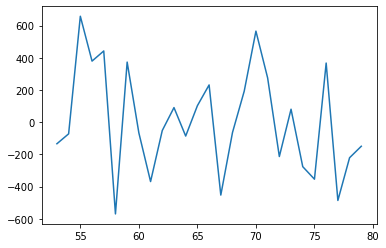

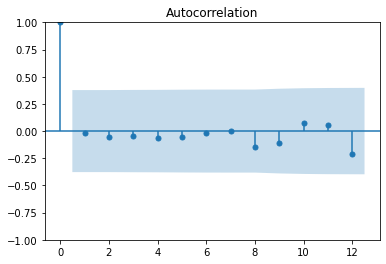

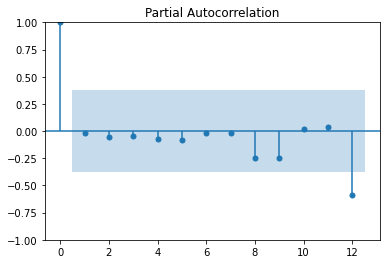

In [289]:
fit = SARIMAX(endog = y15842_train, order = (3,1,0), seasonal_order = (0,1,0,52)).fit()
print(fit.summary())
residuos = fit.resid[(s+1):]
 
nlags=12

plt.plot(residuos)
plt.show()
plot_acf(residuos, lags = nlags)
plt.show()
plot_pacf(residuos, method="ols",lags = nlags)
plt.show()

Shapiro: Statistic value 0.9766061902046204 p-value 0.7790433168411255


C:\Users\amish\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



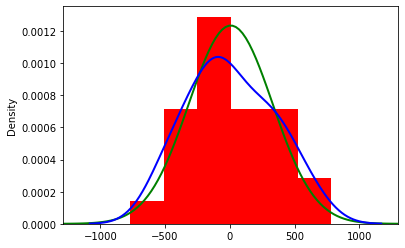

In [290]:
# Noramlity and residual test
saphiro = shapiro(residuos)
print("Shapiro: Statistic value", saphiro[0],"p-value",saphiro[1]) # first output "The test statistic", second output "p-value"

mean = np.mean(residuos)
std = np.std(residuos)
mu = np.mean(residuos)
sigma = np.std(residuos)
x = np.linspace(mu -4*sigma, mu +4*sigma, 100)
pdf = st.norm.pdf(x, mu, sigma)
ax = plt.plot(x, pdf, lw = 2, color = "g")
ax = plt.hist(residuos,density=True, range = (mean - 4*std, mean + 4*std), color = "r")
ax = sns.distplot(residuos, hist = False, kde = True,
                 kde_kws = {'linewidth': 2}, color = "blue")
ax.set_xlim(mean - 4*std, mean + 4*std)

plt.show()

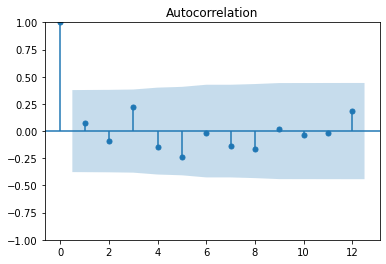

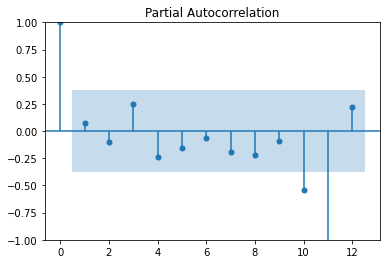

In [291]:
## ACF and PACF for square residuals
plot_acf(residuos**2,lags=12)
plt.show()
plot_pacf(residuos**2,lags=12,method="ols")
plt.show()

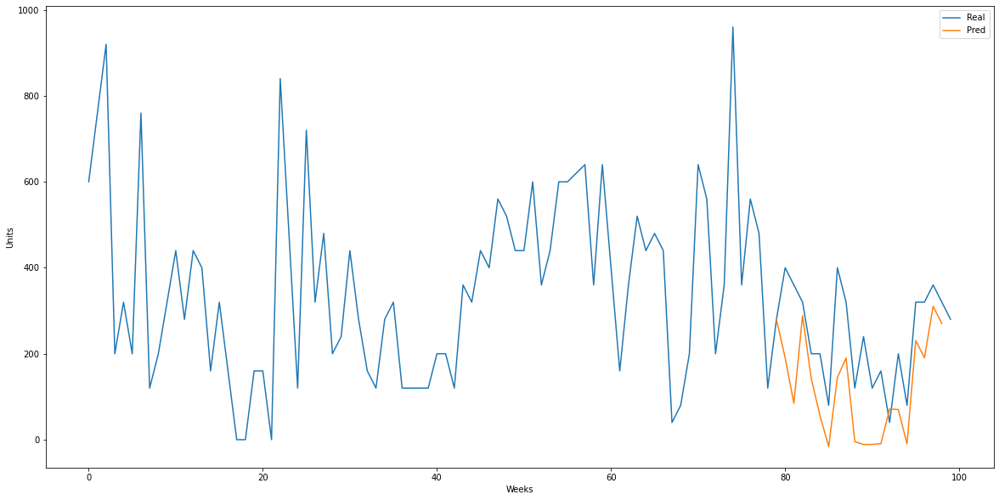

In [292]:
## Testing model

# Plotting predictions
y_pred = fit.forecast(steps = 19)

# Putting the last real index
y_pred.loc[len(y15842_train)-1] = y15842_train[len(y15842_train)-1]

# We reset the indices, sort by index and put the index back as the Series index.
y_pred = y_pred.reset_index().sort_values(by = 'index').set_index('index')

#Plotting 
plt.figure(figsize = (20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_15842, label = 'Real')
plt.plot(y_pred, label = 'Pred')
plt.legend()
plt.show()

In [293]:
print("MAPE score: ", mean_absolute_percentage_error(y15842_test, y_pred))
print("MAE score: ", mean_absolute_error(y15842_test, y_pred))

MAPE score:  0.587040025613035
MAE score:  134.97729821638762


### 19.4.3. Creating a prediction for the next 8 weeks

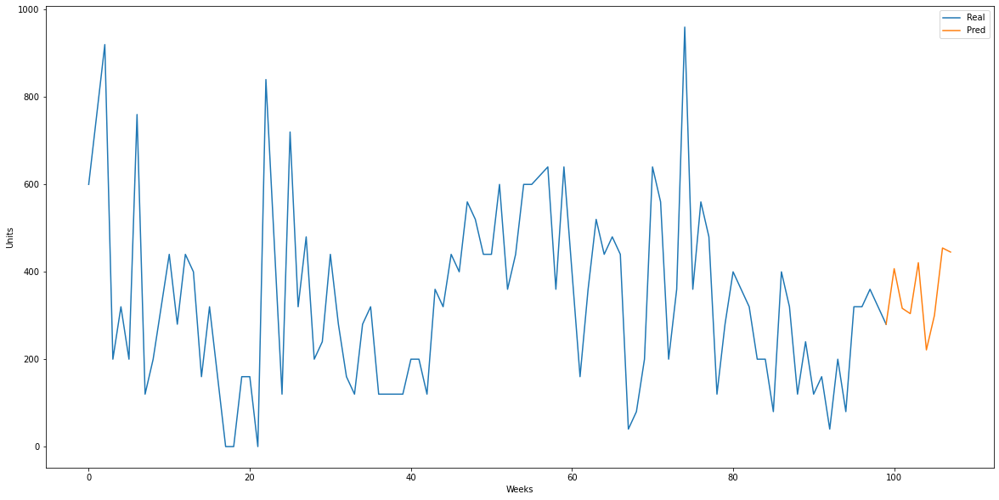

In [294]:
#Using the same sarima model to forecast 8 weeks in the future
fit = SARIMAX(endog = y_15842, order = (3,1,0), seasonal_order = (0,1,0,52)).fit()

y_pred_final = fit.forecast(steps=8)

# Add the last observed value to the predictions
y_pred_final.loc[len(y_15842)-1] = y_15842[len(y_15842)-1]

# Reset the index and sort by index
y_pred_final = y_pred_final.reset_index().sort_values(by='index').set_index('index')

# Plot the predictions along with the observed data
plt.figure(figsize=(20,10))
plt.xlabel('Weeks')
plt.ylabel('Units')
plt.plot(y_15842, label='Real')
plt.plot(y_pred_final, label='Pred')
plt.legend()
plt.show()


In [295]:
# Extract the forecasted values and their corresponding dates
forecast_dates = y_pred_final.index
forecast_values = y_pred_final.iloc[:, 0].values.round(0)

# Create a DataFrame with the predicted values and their corresponding dates
forecast_df14 = pd.DataFrame({'Date': forecast_dates, 'Forecast': forecast_values})

# Display the resulting DataFrame
print(forecast_df14)

   Date  Forecast
0    99     280.0
1   100     407.0
2   101     316.0
3   102     304.0
4   103     421.0
5   104     221.0
6   105     300.0
7   106     455.0
8   107     445.0


In [296]:
predictions14 = {'Date': ['2022-40', '2022-41', '2022-42', '2022-43', '2022-44', '2022-45', '2022-46', '2022-47'],
                'ID_Material': ['120015842','120015842','120015842','120015842','120015842','120015842','120015842','120015842',],
        'Forecast': [407, 316, 304, 421, 221, 300, 455, 445]}

# Create the new DataFrame
df_forecast14 = pd.DataFrame(predictions14)

# Print the new DataFrame
print(df_forecast14)

      Date ID_Material  Forecast
0  2022-40   120015842       407
1  2022-41   120015842       316
2  2022-42   120015842       304
3  2022-43   120015842       421
4  2022-44   120015842       221
5  2022-45   120015842       300
6  2022-46   120015842       455
7  2022-47   120015842       445


# 20. Compiling all Predictions <a id='section-20'></a>

In [297]:
# Concatenate the two DataFrames vertically
df_combined = pd.concat([df_forecast1, df_forecast2, df_forecast3, df_forecast4, 
                         df_forecast5, df_forecast6, df_forecast7, df_forecast8, 
                         df_forecast9, df_forecast10, df_forecast11, df_forecast12, 
                         df_forecast13, df_forecast14], axis=0)

# Print the combined DataFrame
df_combined

,Date,ID_Material,Forecast
0,2022-40,120010970,962
1,2022-41,120010970,722
2,2022-42,120010970,1027
3,2022-43,120010970,952
4,2022-44,120010970,1436
5,2022-45,120010970,1162
6,2022-46,120010970,1346
7,2022-47,120010970,971
0,2022-40,120011782,3088
1,2022-41,120011782,2788


In [298]:
df_combined.shape

(112, 3)

In [299]:
# Let's export our final results as a json file

df_combined.to_json('combined_forecasts.json', orient='table', indent=2, index=False)